In [48]:
#train pipleline\
# sum ampl/ count



In [49]:
import numpy as np
import matplotlib.pyplot as plt
import pickle

from scipy.ndimage import gaussian_filter

In [50]:
N_BINS = 80

SIGMA = 1.0

EPS = 1e-10

SKIP_TIMESTEPS = 50

GAUSSIAN_KERNEL = (5, 5)


In [51]:
def get_input_data(
    pkl_path,
    layer_name,
):
    """
    Load the 2D trajectory dataset.

    Returns
    -------
    ground_truth : (n_traj, T, 2)

    prediction : (n_traj, T, 2)

    positions : (n_traj, T, 2)

    activations : (n_traj, T, n_neurons)
    """

    with open(pkl_path, "rb") as f:
        data = pickle.load(f)

    ground_truth = np.asarray(data["ground_truth"])

    prediction = np.asarray(data["prediction"])

    activations = np.asarray(data[layer_name])

    positions = prediction.copy()

    if SKIP_TIMESTEPS > 0:

        ground_truth = ground_truth[:, SKIP_TIMESTEPS:, :]

        prediction = prediction[:, SKIP_TIMESTEPS:, :]

        positions = positions[:, SKIP_TIMESTEPS:, :]

        activations = activations[:, SKIP_TIMESTEPS:, :]

    return (
        ground_truth,
        prediction,
        positions,
        activations,
    )

In [52]:
def get_arena_bounds(positions):
    """
    Compute global arena bounds across all trajectories.

    Parameters
    ----------
    positions : ndarray
        Shape (n_traj, T, 2)

    Returns
    -------
    bounds : tuple
        (xmin, xmax, ymin, ymax)
    """

    xmin = np.min(positions[:, :, 0])
    xmax = np.max(positions[:, :, 0])

    ymin = np.min(positions[:, :, 1])
    ymax = np.max(positions[:, :, 1])

    return (
        float(xmin),
        float(xmax),
        float(ymin),
        float(ymax),
    )

In [53]:
def get_arena_bounds(positions_list):
    """
    Compute global arena bounds shared across every trajectory.
    """

    all_positions = np.concatenate(positions_list, axis=0)

    xmin = np.min(all_positions[:,0])
    xmax = np.max(all_positions[:,0])

    ymin = np.min(all_positions[:,1])
    ymax = np.max(all_positions[:,1])

    return (
        float(xmin),
        float(xmax),
        float(ymin),
        float(ymax),
    )

In [54]:
def bin_positions(
    positions,
    bins=N_BINS,
    bounds=None,
):
    """
    Assign every (x, y) position sample to a spatial bin.

    Parameters
    ----------
    positions : ndarray
        Shape (T, 2)

    bins : int
        Number of bins along each dimension.

    bounds : tuple
        (xmin, xmax, ymin, ymax)

    Returns
    -------
    x_bin : ndarray
        Shape (T,)

    y_bin : ndarray
        Shape (T,)

    x_edges : ndarray
        Bin edges along x.

    y_edges : ndarray
        Bin edges along y.
    """

    xmin, xmax, ymin, ymax = bounds

    x_edges = np.linspace(xmin, xmax, bins + 1)
    y_edges = np.linspace(ymin, ymax, bins + 1)

    x_bin = np.digitize(
        positions[:, 0],
        x_edges,
    ) - 1

    y_bin = np.digitize(
        positions[:, 1],
        y_edges,
    ) - 1

    # Keep indices inside the grid
    x_bin = np.clip(x_bin, 0, bins - 1)
    y_bin = np.clip(y_bin, 0, bins - 1)

    return x_bin, y_bin, x_edges, y_edges

In [55]:
def compute_occupancy_maps(
    x_bin,
    y_bin,
    bins=N_BINS,
):
    """
    Compute 2D occupancy maps.

    Parameters
    ----------
    x_bin : ndarray
    y_bin : ndarray

    Returns
    -------
    count_occupancy : (bins,bins)

    probability_occupancy : (bins,bins)
    """

    count_occupancy = np.zeros((bins, bins), dtype=float)

    # Count visits
    for xb, yb in zip(x_bin, y_bin):
        count_occupancy[yb, xb] += 1

    total = np.sum(count_occupancy)

    if total > 0:
        probability_occupancy = count_occupancy / total
    else:
        probability_occupancy = np.zeros_like(count_occupancy)

    return count_occupancy, probability_occupancy

In [56]:
def compute_activity_maps(
    activity,
    x_bin,
    y_bin,
    bins=N_BINS,
):
    """
    Compute 2D activity maps for ONE neuron.

    Parameters
    ----------
    activity : ndarray
        Shape (T,)

    x_bin : ndarray
        Shape (T,)

    y_bin : ndarray
        Shape (T,)

    Returns
    -------
    amplitude_activity : (bins, bins)

    real_activity : (bins, bins)
    """

    amplitude = np.abs(activity)

    real = np.real(activity)

    amplitude_activity = np.zeros((bins, bins), dtype=float)

    real_activity = np.zeros((bins, bins), dtype=float)

    for a, r, xb, yb in zip(
        amplitude,
        real,
        x_bin,
        y_bin,
    ):

        amplitude_activity[yb, xb] += a

        real_activity[yb, xb] += r

    return amplitude_activity

In [57]:
def compute_firing_rate_map(
    activity_map,
    occupancy_map,
    eps=EPS,
):
    """
    Compute firing-rate map.

    Works for both 1D and 2D arrays.

    Parameters
    ----------
    activity_map : ndarray
    occupancy_map : ndarray

    Returns
    -------
    firing_rate_map : ndarray
    """

    firing_rate = np.divide(
        activity_map,
        occupancy_map + eps,
    )

    firing_rate[occupancy_map == 0] = 0

    return firing_rate

In [58]:
from scipy.signal import convolve2d


def matlab_style_gauss2D(shape=(5, 5), sigma=1.0):
    """
    2D Gaussian mask equivalent to MATLAB's

        fspecial('gaussian', shape, sigma)

    Parameters
    ----------
    shape : tuple
        Size of the Gaussian kernel.

    sigma : float
        Standard deviation of the Gaussian.

    Returns
    -------
    h : ndarray
        Normalized Gaussian kernel.
    """

    m, n = [(ss - 1.) / 2. for ss in shape]

    y, x = np.ogrid[-m:m+1, -n:n+1]

    h = np.exp(-(x*x + y*y) / (2.0 * sigma * sigma))

    h[h < np.finfo(h.dtype).eps * h.max()] = 0

    if h.sum() != 0:
        h /= h.sum()

    return h


def smooth_firing_rate_map(
    firing_rate_map,
    sigma=SIGMA,
    kernel_shape=GAUSSIAN_KERNEL,
):
    """
    Smooth a firing-rate map using a MATLAB-style Gaussian kernel.

    Parameters
    ----------
    firing_rate_map : ndarray
        2D firing-rate map.

    sigma : float
        Gaussian standard deviation.

    kernel_shape : tuple
        Kernel size used by MATLAB's fspecial.
    """

    kernel = matlab_style_gauss2D(
        shape=kernel_shape,
        sigma=sigma,
    )

    smoothed = convolve2d(
        firing_rate_map,
        kernel,
        mode="same",
        boundary="symm",
    )

    return smoothed

In [59]:
def spatial_information(rate_map, occupancy_map):
    """
    Spatial Information (bits/spike)

    Parameters
    ----------
    rate_map : ndarray
        Smoothed firing-rate map

    occupancy_map : ndarray
        Count or probability occupancy
    """

    occ = occupancy_map.astype(float)
    occ = occ / occ.sum()

    valid = (
        (~np.isnan(rate_map))
        & (occ > 0)
        & (rate_map > 0)
    )

    if np.sum(valid) == 0:
        return np.nan

    p = occ[valid]
    r = rate_map[valid]

    r_bar = np.sum(p * r)

    if r_bar <= EPS:
        return np.nan

    ratio = r / r_bar

    return np.sum(
        p * ratio * np.log2(ratio)
    )

In [60]:
def sparsity(rate_map, occupancy_map):
    """
    Population sparsity
    """

    occ = occupancy_map.astype(float)
    occ = occ / occ.sum()

    valid = (
        (~np.isnan(rate_map))
        & (occ > 0)
    )

    if np.sum(valid) == 0:
        return np.nan

    p = occ[valid]
    r = rate_map[valid]

    mean_r = np.sum(p * r)
    mean_r2 = np.sum(p * r**2)

    if mean_r2 <= EPS:
        return np.nan

    return (mean_r**2) / mean_r2

In [61]:
def evaluate_place_cell(rate_map, occupancy_map):
    """
    Compute place-cell metrics from a raw firing-rate map.
    """

    return {
        "Spatial Information": spatial_information(
            rate_map,
            occupancy_map,
        ),
        "Sparsity": sparsity(
            rate_map,
            occupancy_map,
        ),
    }

In [62]:
def compute_neuron_grid_score(
    positions,
    activity,
    bounds,
    bins=N_BINS,
    fixed_radius=None,
):
    """
    Compute the complete grid-cell pipeline for one neuron.

    Parameters
    ----------
    fixed_radius : float or None
        If provided, use this radius instead of estimating one.
        Useful for shuffle analysis.
    """

    # --------------------------------------------------
    # Bin positions
    # --------------------------------------------------

    x_bin, y_bin, _, _ = bin_positions(
        positions,
        bins=bins,
        bounds=bounds,
    )

    count_occ, _ = compute_occupancy_maps(
        x_bin,
        y_bin,
        bins=bins,
    )

    # --------------------------------------------------
    # Activity map
    # --------------------------------------------------

    amp_activity, _ = compute_activity_maps(
        activity,
        x_bin,
        y_bin,
        bins=bins,
    )

    # --------------------------------------------------
    # Rate map
    # --------------------------------------------------

    rate_map = compute_firing_rate_map(
        amp_activity,
        count_occ,
    )

    rate_map = smooth_firing_rate_map(
        rate_map,
    )

    # --------------------------------------------------
    # Spatial autocorrelation
    # --------------------------------------------------

    autocorr = spatial_autocorrelation(
        rate_map,
    )

    # --------------------------------------------------
    # Peak detection
    # --------------------------------------------------

    peaks = detect_autocorr_peaks(
        autocorr,
    )

    peaks = merge_close_peaks(
        peaks,
        min_distance=6,
    )

    if len(peaks) == 0:
        return None

    centre = centre_peak(
        peaks,
        autocorr.shape,
    )

    # --------------------------------------------------
    # Ring radius
    # --------------------------------------------------

    if fixed_radius is None:

        radius = first_ring_radius(
            peaks,
            centre,
        )

    else:

        radius = fixed_radius

    if radius is None:
        return None

    # --------------------------------------------------
    # Grid score
    # --------------------------------------------------

    grid_score, correlations = compute_grid_score(
        autocorr,
        inner_radius=0.5 * radius,
        outer_radius=1.5 * radius,
    )

    return {

        "grid_score": grid_score,

        "correlations": correlations,

        "rate_map": rate_map,

        "autocorr": autocorr,

        "radius": radius,

        "centre": centre,

        "peaks": peaks,

    }

In [63]:
def centre_peak(
    peaks,
    shape,
):
    """
    Find centroid closest to image centre.
    """

    centre = np.array(shape) / 2

    distances = np.linalg.norm(
        peaks - centre,
        axis=1,
    )

    return peaks[np.argmin(distances)]


def peak_distances(
    peaks,
    centre,
):
    """
    Euclidean distance from centre to every peak.
    """

    return np.linalg.norm(
        peaks - centre,
        axis=1,
    )


def first_ring_radius(
    peaks,
    centre,
    min_radius=10,
):
    """
    Estimate the radius of the first ring of peaks.
    """

    distances = np.linalg.norm(
        peaks - centre,
        axis=1,
    )

    # Ignore centre peak
    distances = distances[
        distances > min_radius
    ]

    if len(distances) < 6:
        return None

    # Sort by distance
    distances = np.sort(distances)

    # First six surrounding peaks
    first_ring = distances[:6]

    # Remove obvious outliers
    median = np.median(first_ring)

    first_ring = first_ring[
        np.abs(first_ring - median) < 8
    ]

    if len(first_ring) == 0:
        return None

    return np.median(first_ring)

In [64]:
def merge_close_peaks(
    peaks,
    min_distance=6,
):
    """
    Merge peaks that are very close together.

    Parameters
    ----------
    peaks : ndarray (N,2)

    min_distance : float
        Peaks closer than this are merged.

    Returns
    -------
    merged_peaks
    """

    if len(peaks) == 0:
        return peaks

    remaining = peaks.tolist()
    merged = []

    while len(remaining):

        current = np.array(remaining.pop(0))

        cluster = [current]

        keep = []

        for p in remaining:

            p = np.array(p)

            if np.linalg.norm(
                current - p
            ) < min_distance:

                cluster.append(p)

            else:

                keep.append(p)

        remaining = keep

        merged.append(
            np.mean(cluster, axis=0)
        )

    return np.array(merged)

In [65]:
def evaluate_place_cell(
    rate_map,
    occupancy_map,
):
    """
    Compute place-cell metrics for one firing-rate map.

    Parameters
    ----------
    rate_map : ndarray
        Smoothed firing-rate map.

    occupancy_map : ndarray
        Count or probability occupancy map.

    Returns
    -------
    metrics : dict
        Spatial Information and Sparsity.
    """

    return {
        "SI": spatial_information(
            rate_map,
            occupancy_map,
        ),
        "Sparsity": sparsity(
            rate_map,
            occupancy_map,
        ),
    }

In [66]:
import numpy as np


def point_correlation(
    rate_map,
    row_shift,
    col_shift,
):
    """
    Fast Pearson correlation between a rate map
    and a shifted copy.
    """

    rows, cols = rate_map.shape

    r1_start = max(0, row_shift)
    r1_end   = min(rows, rows + row_shift)

    r2_start = max(0, -row_shift)
    r2_end   = min(rows, rows - row_shift)

    c1_start = max(0, col_shift)
    c1_end   = min(cols, cols + col_shift)

    c2_start = max(0, -col_shift)
    c2_end   = min(cols, cols - col_shift)

    x = rate_map[
        r1_start:r1_end,
        c1_start:c1_end,
    ]

    y = rate_map[
        r2_start:r2_end,
        c2_start:c2_end,
    ]

    valid = np.isfinite(x) & np.isfinite(y)

    if valid.sum() < 20:
        return np.nan

    x = x[valid]
    y = y[valid]

    x = x - x.mean()
    y = y - y.mean()

    denom = np.sqrt(
        np.sum(x*x) *
        np.sum(y*y)
    )

    if denom == 0:
        return np.nan

    return np.sum(x*y) / denom


def spatial_autocorrelation(rate_map):

    bins = rate_map.shape[0]

    autocorr = np.empty(
        (2*bins-1,2*bins-1),
        dtype=np.float32,
    )

    shifts = np.arange(
        -(bins-1),
        bins,
        dtype=np.int32,
    )

    for i,row_shift in enumerate(shifts):

        for j,col_shift in enumerate(shifts):

            autocorr[i,j] = point_correlation(
                rate_map,
                row_shift,
                col_shift,
            )

    return autocorr

In [20]:
from scipy.ndimage import maximum_filter

def detect_autocorr_peaks(
    autocorr,
    threshold=0.10,
    neighbourhood=5,
):
    """
    Detect local maxima in the autocorrelogram.
    """

    local_max = (
        autocorr ==
        maximum_filter(
            autocorr,
            size=neighbourhood,
        )
    )

    local_max &= autocorr > threshold

    peaks = np.argwhere(local_max)

    return peaks.astype(float)

In [21]:
def circular_shuffle(
    activity,
    min_shift=20,
):
    """
    Circularly shift a neuron's activity.

    Parameters
    ----------
    activity : (T,)

    min_shift : int
        Minimum shift to avoid trivial shuffles.

    Returns
    -------
    shuffled_activity
    """

    T = len(activity)

    shift = np.random.randint(
        min_shift,
        T - min_shift,
    )

    shuffled = np.roll(
        activity,
        shift,
    )

    return shuffled

In [22]:
import numpy as np


def compute_grid_score(
    autocorr,
    inner_radius,
    outer_radius,
):
    """
    Calculate grid score from a spatial autocorrelation map.

    Grid score is:

        mean(correlation at 60, 120 degrees)
        -
        mean(correlation at 30, 90, 150 degrees)

    Parameters
    ----------
    autocorr : 2D numpy array
        Spatial autocorrelation map.

    inner_radius : float
        Inner radius of the annulus around the centre.

    outer_radius : float
        Outer radius of the annulus.

    Returns
    -------
    grid_score : float
        Hexagonal/grid-like symmetry score.

    correlations : dict
        Correlations for each rotation angle.
    """

    # --------------------------------------------------------
    # Centre of autocorrelation map
    # --------------------------------------------------------

    centre_y = (autocorr.shape[0] - 1) / 2
    centre_x = (autocorr.shape[1] - 1) / 2

    y, x = np.indices(autocorr.shape)

    distance = np.sqrt(
        (x - centre_x) ** 2 +
        (y - centre_y) ** 2
    )

    # --------------------------------------------------------
    # Build annulus
    # --------------------------------------------------------

    annulus_mask = (
        (distance >= inner_radius) &
        (distance <= outer_radius)
    )

    # Extract annulus
    annulus = np.where(
        annulus_mask,
        autocorr,
        np.nan
    )

    # --------------------------------------------------------
    # Rotation correlation
    # --------------------------------------------------------

    def rotate_map_approx(angle):

        # Convert angle to radians
        theta = np.deg2rad(angle)

        # Coordinates relative to centre
        dx = x - centre_x
        dy = y - centre_y

        # Rotate coordinates
        xr = (
            np.cos(theta) * dx
            - np.sin(theta) * dy
        ) + centre_x

        yr = (
            np.sin(theta) * dx
            + np.cos(theta) * dy
        ) + centre_y

        # Nearest-neighbour sampling
        xr = np.rint(xr).astype(int)
        yr = np.rint(yr).astype(int)

        valid = (
            (xr >= 0) &
            (xr < autocorr.shape[1]) &
            (yr >= 0) &
            (yr < autocorr.shape[0])
        )

        rotated = np.full_like(
            autocorr,
            np.nan,
            dtype=float
        )

        rotated[valid] = autocorr[
            yr[valid],
            xr[valid]
        ]

        return rotated

    # --------------------------------------------------------
    # Calculate correlations
    # --------------------------------------------------------

    angles = [30, 60, 90, 120, 150]

    correlations = {}

    original_values = autocorr[annulus_mask]

    for angle in angles:

        rotated = rotate_map_approx(angle)

        rotated_values = rotated[annulus_mask]

        # Remove invalid values
        valid = (
            np.isfinite(original_values) &
            np.isfinite(rotated_values)
        )

        if np.sum(valid) < 3:

            correlations[angle] = np.nan

        else:

            correlations[angle] = np.corrcoef(
                original_values[valid],
                rotated_values[valid]
            )[0, 1]

    # --------------------------------------------------------
    # Grid score
    # --------------------------------------------------------

    six_fold = np.nanmean([
        correlations[60],
        correlations[120],
    ])

    three_fold = np.nanmean([
        correlations[30],
        correlations[90],
        correlations[150],
    ])

    grid_score = six_fold - three_fold

    return grid_score, correlations

#main


In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ============================================================
# CLEAN D4 ANALYSIS SETUP
# ============================================================

# These should already exist from your loading cell:
# positions
# activations

trajectory_results_path = (
    r"C:\Users\ALL AtoZ\Desktop\2d_hippocampal_cells"
    r"\2D-traj-results-training.pkl"
)

layers = ["d1", "d2", "d3", "d4"]

ground_truth, prediction, positions, activations = get_input_data(
    trajectory_results_path,
    layers[-1],
)

print("Positions:", positions.shape)
print("Activations:", activations.shape)

# ------------------------------------------------------------
# Select the 10 spatially diverse trajectories we already chose
# ------------------------------------------------------------

selected_trajectories = [
    342, 407, 424, 476, 331,
    50, 382, 201, 234, 151
]

print("\nSelected trajectories:")
print(selected_trajectories)

# ------------------------------------------------------------
# Extract D4
# ------------------------------------------------------------

# Expected shape:
# (500 trajectories, 450 timesteps, 100 neurons)

d4 = activations

print("\nD4 shape:", d4.shape)

n_trajectories, n_time, n_neurons = d4.shape

print("Number of neurons:", n_neurons)
print("Timesteps:", n_time)

Positions: (500, 450, 2)
Activations: (500, 450, 100)

Selected trajectories:
[342, 407, 424, 476, 331, 50, 382, 201, 234, 151]

D4 shape: (500, 450, 100)
Number of neurons: 100
Timesteps: 450


In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# LOAD POSITIONS
# ============================================================

trajectory_results_path = (
    r"C:\Users\ALL AtoZ\Desktop\2d_hippocampal_cells"
    r"\2D-traj-results-training.pkl"
)

# We can load d1 just to get the positions.
# Positions are shared across the layers.
ground_truth, prediction, positions, activations = get_input_data(
    trajectory_results_path,
    "d1",
)

print("Positions shape:", positions.shape)

# ============================================================
# SETTINGS
# ============================================================

n_trajectories_to_select = 10

# Use the same binning resolution as your grid-cell analysis
n_bins = N_BINS

bounds = get_arena_bounds(positions)

print("Bounds:", bounds)
print("Number of bins:", n_bins)

# ============================================================
# CALCULATE OCCUPANCY BINS FOR EVERY TRAJECTORY
# ============================================================

trajectory_bin_sets = []

for trajectory in range(positions.shape[0]):

    x_bin, y_bin, x_edges, y_edges = bin_positions(
        positions[trajectory],
        bins=n_bins,
        bounds=bounds,
    )

    # Convert (x,y) bins into a single integer ID
    bin_ids = (
        x_bin.astype(int) * n_bins
        + y_bin.astype(int)
    )

    # Unique spatial bins visited by this trajectory
    unique_bins = np.unique(bin_ids)

    trajectory_bin_sets.append(
        set(unique_bins)
    )

# ============================================================
# GREEDY COVERAGE SELECTION
# ============================================================

selected_trajectories = []
covered_bins = set()

remaining = set(range(len(trajectory_bin_sets)))

for i in range(n_trajectories_to_select):

    best_trajectory = None
    best_new_coverage = -1

    for trajectory in remaining:

        new_bins = (
            trajectory_bin_sets[trajectory]
            - covered_bins
        )

        new_coverage = len(new_bins)

        if new_coverage > best_new_coverage:

            best_new_coverage = new_coverage
            best_trajectory = trajectory

    selected_trajectories.append(
        best_trajectory
    )

    covered_bins.update(
        trajectory_bin_sets[best_trajectory]
    )

    remaining.remove(
        best_trajectory
    )

# ============================================================
# DISPLAY RESULTS
# ============================================================

print("\n" + "=" * 70)
print("SELECTED TRAJECTORIES")
print("=" * 70)

for i, trajectory in enumerate(
    selected_trajectories,
    start=1
):

    print(
        f"{i:2d}. Trajectory {trajectory:3d} | "
        f"Unique bins = "
        f"{len(trajectory_bin_sets[trajectory])}"
    )

print(
    "\nTotal unique spatial bins covered:",
    len(covered_bins),
    "/",
    n_bins * n_bins
)

Positions shape: (500, 450, 2)
Bounds: (0.027809273451566696, 0.9689222574234009, 0.0295569971203804, 0.9583374857902527)
Number of bins: 80

SELECTED TRAJECTORIES
 1. Trajectory 342 | Unique bins = 369
 2. Trajectory 407 | Unique bins = 365
 3. Trajectory 424 | Unique bins = 352
 4. Trajectory 476 | Unique bins = 355
 5. Trajectory 331 | Unique bins = 360
 6. Trajectory  50 | Unique bins = 360
 7. Trajectory 382 | Unique bins = 356
 8. Trajectory 201 | Unique bins = 352
 9. Trajectory 234 | Unique bins = 349
10. Trajectory 151 | Unique bins = 367

Total unique spatial bins covered: 2816 / 6400


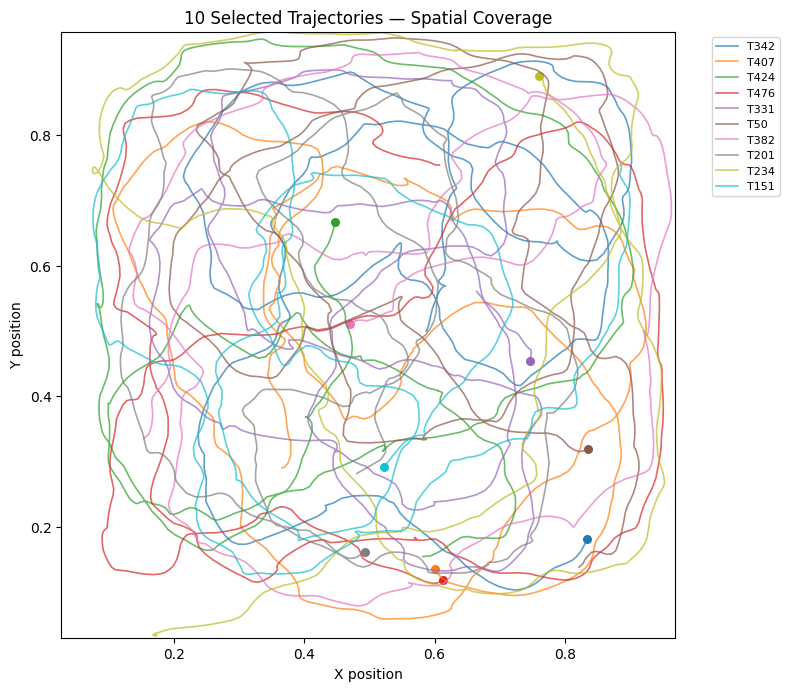

In [28]:
# ============================================================
# VISUALIZE SELECTED TRAJECTORIES
# ============================================================

fig, ax = plt.subplots(
    figsize=(8, 8)
)

for i, trajectory in enumerate(
    selected_trajectories,
    start=1
):

    xy = positions[trajectory]

    ax.plot(
        xy[:, 0],
        xy[:, 1],
        linewidth=1.2,
        alpha=0.7,
        label=f"T{trajectory}"
    )

    # Mark starting point
    ax.scatter(
        xy[0, 0],
        xy[0, 1],
        s=30
    )

ax.set_xlim(bounds[0], bounds[1])
ax.set_ylim(bounds[2], bounds[3])

ax.set_aspect("equal")

ax.set_xlabel("X position")
ax.set_ylabel("Y position")

ax.set_title(
    "10 Selected Trajectories — Spatial Coverage"
)

ax.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    fontsize=8
)

plt.tight_layout()
plt.show()

In [31]:
import numpy as np
import pandas as pd

# ============================================================
# SETTINGS
# ============================================================

trajectory_results_path = (
    r"C:\Users\ALL AtoZ\Desktop\2d_hippocampal_cells"
    r"\2D-traj-results-training.pkl"
)

layers = ["d1", "d2", "d3", "d4"]

N_CANDIDATES = 20

# We already selected these 10 trajectories
# in the previous cell:
#
# selected_trajectories
#
# Example:
# selected_trajectories = [....]


# ============================================================
# SCREENING METHOD
# ============================================================
#
# We will use the spatial activity map to identify neurons
# with structured/non-uniform spatial activity.
#
# This is ONLY a screening step.
# The actual grid score will be calculated later.
# ============================================================


candidate_neurons = {}


for layer_name in layers:

    print("\n" + "=" * 70)
    print(f"SCREENING LAYER: {layer_name}")
    print("=" * 70)

    # --------------------------------------------------------
    # Load layer
    # --------------------------------------------------------

    ground_truth, prediction, positions, activations = (
        get_input_data(
            trajectory_results_path,
            layer_name,
        )
    )

    n_neurons = activations.shape[2]

    # --------------------------------------------------------
    # Store spatial structure score
    #
    # rows    = selected trajectories
    # columns = neurons
    # --------------------------------------------------------

    spatial_scores = np.zeros(
        (len(selected_trajectories), n_neurons)
    )

    # ========================================================
    # TRAJECTORIES
    # ========================================================

    for t_idx, trajectory in enumerate(
        selected_trajectories
    ):

        trajectory_positions = positions[trajectory]

        # ----------------------------------------------------
        # Bin positions
        # ----------------------------------------------------

        x_bin, y_bin, _, _ = bin_positions(
            trajectory_positions,
            bins=N_BINS,
            bounds=bounds,
        )

        # ----------------------------------------------------
        # Occupancy
        # ----------------------------------------------------

        count_occupancy, _ = compute_occupancy_maps(
            x_bin,
            y_bin,
            bins=N_BINS,
        )

        # ====================================================
        # NEURONS
        # ====================================================

        for neuron in range(n_neurons):

            activity = activations[
                trajectory,
                :,
                neuron
            ]

            # ------------------------------------------------
            # Activity map
            # ------------------------------------------------

            amplitude_activity = compute_activity_maps(
                activity,
                x_bin,
                y_bin,
                bins=N_BINS,
            )

            # ------------------------------------------------
            # Firing rate map
            # ------------------------------------------------

            rate_map = compute_firing_rate_map(
                amplitude_activity,
                count_occupancy,
            )

            # ------------------------------------------------
            # Spatial structure metric
            #
            # We use coefficient of variation:
            #
            # std(rate) / mean(rate)
            #
            # Higher = more spatially structured activity.
            # ------------------------------------------------

            valid = np.isfinite(rate_map)

            if np.sum(valid) < 5:
                continue

            values = rate_map[valid]

            mean_rate = np.mean(values)
            std_rate = np.std(values)

            if mean_rate > 1e-12:

                spatial_scores[
                    t_idx,
                    neuron
                ] = std_rate / mean_rate

    # ========================================================
    # AVERAGE ACROSS THE 10 TRAJECTORIES
    # ========================================================

    mean_spatial_score = np.mean(
        spatial_scores,
        axis=0
    )

    # --------------------------------------------------------
    # Rank neurons
    # --------------------------------------------------------

    ranking = pd.DataFrame({
        "Neuron": np.arange(n_neurons),
        "Mean Spatial Score": mean_spatial_score,
    })

    ranking = ranking.sort_values(
        "Mean Spatial Score",
        ascending=False
    ).reset_index(drop=True)

    # --------------------------------------------------------
    # Select top candidates
    # --------------------------------------------------------

    top_candidates = ranking.head(
        N_CANDIDATES
    )

    candidate_neurons[layer_name] = (
        top_candidates["Neuron"]
        .astype(int)
        .tolist()
    )

    print("\nTop candidates:")

    display(top_candidates)


SCREENING LAYER: d1

Top candidates:


,Neuron,Mean Spatial Score
0,47,7.643429
1,26,7.542550
2,85,7.538449
3,84,7.464050
4,95,7.193504
5,91,7.045844
6,82,7.015329
7,73,6.942780
8,97,6.851869
9,24,6.827484



SCREENING LAYER: d2

Top candidates:


,Neuron,Mean Spatial Score
0,38,5.971275
1,30,5.894615
2,35,5.855345
3,72,5.834661
4,92,5.743010
5,85,5.731156
6,60,5.728512
7,17,5.701795
8,8,5.646178
9,22,5.617303



SCREENING LAYER: d3

Top candidates:


,Neuron,Mean Spatial Score
0,17,6.084272
1,49,6.073511
2,14,5.919017
3,6,5.900942
4,55,5.841878
5,8,5.836301
6,25,5.802791
7,4,5.785956
8,57,5.785703
9,79,5.784036



SCREENING LAYER: d4

Top candidates:


,Neuron,Mean Spatial Score
0,36,10.961519
1,78,10.779343
2,76,10.613266
3,79,10.519049
4,10,9.928442
5,44,9.694561
6,77,9.677156
7,71,9.625225
8,94,9.516268
9,50,9.496226


In [32]:
# ============================================================
# ACTUAL GRID SCORES FOR d1 AND d4 CANDIDATES
# ============================================================

import numpy as np
import pandas as pd
import time

candidate_layers = ["d1", "d4"]

actual_grid_scores = {}

for layer_name in candidate_layers:

    print("\n" + "=" * 70)
    print(f"ACTUAL GRID-SCORE ANALYSIS: {layer_name}")
    print("=" * 70)

    start_time = time.time()

    # --------------------------------------------------------
    # Load layer
    # --------------------------------------------------------

    ground_truth, prediction, positions, activations = (
        get_input_data(
            trajectory_results_path,
            layer_name,
        )
    )

    neurons = candidate_neurons[layer_name]

    print(
        f"Candidate neurons: {len(neurons)}"
    )

    print(
        "Neurons:",
        neurons
    )

    # --------------------------------------------------------
    # Store:
    #
    # rows    = trajectories
    # columns = candidate neurons
    # --------------------------------------------------------

    scores = np.full(
        (
            len(selected_trajectories),
            len(neurons)
        ),
        np.nan
    )

    # ========================================================
    # TRAJECTORIES
    # ========================================================

    for t_idx, trajectory in enumerate(
        selected_trajectories
    ):

        print(
            f"Trajectory "
            f"{t_idx + 1}/{len(selected_trajectories)} "
            f"(original {trajectory})"
        )

        trajectory_positions = positions[trajectory]

        # ----------------------------------------------------
        # BIN POSITIONS
        # ----------------------------------------------------

        x_bin, y_bin, _, _ = bin_positions(
            trajectory_positions,
            bins=N_BINS,
            bounds=bounds,
        )

        # ----------------------------------------------------
        # OCCUPANCY
        # ----------------------------------------------------

        count_occupancy, probability_occupancy = (
            compute_occupancy_maps(
                x_bin,
                y_bin,
                bins=N_BINS,
            )
        )

        # ====================================================
        # CANDIDATE NEURONS
        # ====================================================

        for n_idx, neuron in enumerate(neurons):

            activity = activations[
                trajectory,
                :,
                neuron
            ]

            # ------------------------------------------------
            # ACTIVITY MAP
            # ------------------------------------------------

            amplitude_activity = compute_activity_maps(
                activity,
                x_bin,
                y_bin,
                bins=N_BINS,
            )

            # ------------------------------------------------
            # FIRING RATE MAP
            # ------------------------------------------------

            rate_map = compute_firing_rate_map(
                amplitude_activity,
                count_occupancy,
            )

            rate_map = smooth_firing_rate_map(
                rate_map
            )

            # ------------------------------------------------
            # AUTOCORRELATION
            # ------------------------------------------------

            autocorr = spatial_autocorrelation(
                rate_map
            )

            # ------------------------------------------------
            # PEAKS
            # ------------------------------------------------

            peaks = detect_autocorr_peaks(
                autocorr
            )

            peaks = merge_close_peaks(
                peaks,
                min_distance=6,
            )

            if len(peaks) == 0:
                continue

            # ------------------------------------------------
            # CENTRE
            # ------------------------------------------------

            centre = centre_peak(
                peaks,
                autocorr.shape,
            )

            # ------------------------------------------------
            # RADIUS
            # ------------------------------------------------

            radius = first_ring_radius(
                peaks,
                centre,
            )

            if radius is None:
                continue

            # ------------------------------------------------
            # ACTUAL GRID SCORE
            # ------------------------------------------------

            grid_score, correlations = compute_grid_score(
                autocorr,
                inner_radius=0.5 * radius,
                outer_radius=1.5 * radius,
            )

            scores[
                t_idx,
                n_idx
            ] = grid_score

    # --------------------------------------------------------
    # Store
    # --------------------------------------------------------

    actual_grid_scores[layer_name] = scores

    print(
        f"\nFinished {layer_name} in "
        f"{time.time() - start_time:.1f} seconds"
    )


ACTUAL GRID-SCORE ANALYSIS: d1
Candidate neurons: 20
Neurons: [47, 26, 85, 84, 95, 91, 82, 73, 97, 24, 12, 66, 42, 40, 90, 16, 98, 53, 11, 65]
Trajectory 1/10 (original 342)
Trajectory 2/10 (original 407)
Trajectory 3/10 (original 424)
Trajectory 4/10 (original 476)
Trajectory 5/10 (original 331)
Trajectory 6/10 (original 50)
Trajectory 7/10 (original 382)
Trajectory 8/10 (original 201)
Trajectory 9/10 (original 234)
Trajectory 10/10 (original 151)

Finished d1 in 587.6 seconds

ACTUAL GRID-SCORE ANALYSIS: d4
Candidate neurons: 20
Neurons: [36, 78, 76, 79, 10, 44, 77, 71, 94, 50, 39, 37, 23, 25, 8, 53, 96, 64, 67, 62]
Trajectory 1/10 (original 342)
Trajectory 2/10 (original 407)
Trajectory 3/10 (original 424)
Trajectory 4/10 (original 476)
Trajectory 5/10 (original 331)
Trajectory 6/10 (original 50)
Trajectory 7/10 (original 382)
Trajectory 8/10 (original 201)
Trajectory 9/10 (original 234)
Trajectory 10/10 (original 151)

Finished d4 in 586.9 seconds


In [33]:
# ============================================================
# AVERAGE ACTUAL GRID SCORES PER NEURON
# ============================================================

final_grid_results = {}

for layer_name in candidate_layers:

    scores = actual_grid_scores[layer_name]
    neurons = candidate_neurons[layer_name]

    mean_scores = np.nanmean(
        scores,
        axis=0
    )

    std_scores = np.nanstd(
        scores,
        axis=0
    )

    valid_counts = np.sum(
        np.isfinite(scores),
        axis=0
    )

    df = pd.DataFrame({
        "Layer": layer_name,
        "Neuron": neurons,
        "Mean Grid Score": mean_scores,
        "Std Grid Score": std_scores,
        "Valid Trajectories": valid_counts,
    })

    df = df.sort_values(
        "Mean Grid Score",
        ascending=False
    ).reset_index(drop=True)

    final_grid_results[layer_name] = df

    print("\n" + "=" * 70)
    print(f"ACTUAL GRID SCORES — {layer_name}")
    print("=" * 70)

    display(df)


ACTUAL GRID SCORES — d1


,Layer,Neuron,Mean Grid Score,Std Grid Score,Valid Trajectories
0,d1,12,-0.010802,0.174367,10
1,d1,90,-0.039102,0.109888,10
2,d1,16,-0.073642,0.136467,10
3,d1,82,-0.085309,0.156443,10
4,d1,42,-0.088587,0.221161,10
5,d1,11,-0.104864,0.193643,10
6,d1,95,-0.113749,0.137064,10
7,d1,84,-0.115380,0.219715,10
8,d1,53,-0.119781,0.067788,10
9,d1,91,-0.123985,0.154754,10



ACTUAL GRID SCORES — d4


,Layer,Neuron,Mean Grid Score,Std Grid Score,Valid Trajectories
0,d4,10,0.064884,0.173990,10
1,d4,78,0.052135,0.165482,10
2,d4,53,0.043906,0.204181,10
3,d4,76,0.023310,0.142209,10
4,d4,94,0.000826,0.194437,10
5,d4,36,-0.013741,0.093827,10
6,d4,79,-0.021773,0.109878,10
7,d4,44,-0.054284,0.153291,9
8,d4,71,-0.066285,0.152205,10
9,d4,62,-0.069236,0.165035,10


In [34]:
# ============================================================
# CHECK CONSISTENCY OF d4 NEURON 77
# ============================================================

layer_name = "d4"
neuron = 77

ground_truth, prediction, positions, activations = (
    get_input_data(
        trajectory_results_path,
        layer_name,
    )
)

neuron_scores = []

for trajectory in selected_trajectories:

    trajectory_positions = positions[trajectory]

    # --------------------------------------------------------
    # Position bins
    # --------------------------------------------------------

    x_bin, y_bin, _, _ = bin_positions(
        trajectory_positions,
        bins=N_BINS,
        bounds=bounds,
    )

    # --------------------------------------------------------
    # Occupancy
    # --------------------------------------------------------

    count_occupancy, _ = compute_occupancy_maps(
        x_bin,
        y_bin,
        bins=N_BINS,
    )

    # --------------------------------------------------------
    # Activity
    # --------------------------------------------------------

    activity = activations[
        trajectory,
        :,
        neuron
    ]

    amplitude_activity = compute_activity_maps(
        activity,
        x_bin,
        y_bin,
        bins=N_BINS,
    )

    # --------------------------------------------------------
    # Rate map
    # --------------------------------------------------------

    rate_map = compute_firing_rate_map(
        amplitude_activity,
        count_occupancy,
    )

    rate_map = smooth_firing_rate_map(rate_map)

    # --------------------------------------------------------
    # Autocorrelation
    # --------------------------------------------------------

    autocorr = spatial_autocorrelation(rate_map)

    # --------------------------------------------------------
    # Peaks
    # --------------------------------------------------------

    peaks = detect_autocorr_peaks(autocorr)

    peaks = merge_close_peaks(
        peaks,
        min_distance=6,
    )

    if len(peaks) == 0:
        neuron_scores.append(np.nan)
        continue

    centre = centre_peak(
        peaks,
        autocorr.shape,
    )

    radius = first_ring_radius(
        peaks,
        centre,
    )

    if radius is None:
        neuron_scores.append(np.nan)
        continue

    grid_score, correlations = compute_grid_score(
        autocorr,
        inner_radius=0.5 * radius,
        outer_radius=1.5 * radius,
    )

    neuron_scores.append(grid_score)


# ============================================================
# DISPLAY
# ============================================================

check_df = pd.DataFrame({
    "Trajectory": selected_trajectories,
    "Grid Score": neuron_scores,
})

display(check_df)

print(
    "Mean:",
    np.nanmean(neuron_scores)
)

print(
    "Std:",
    np.nanstd(neuron_scores)
)

,Trajectory,Grid Score
0,342,-0.218570
1,407,0.036304
2,424,-0.203503
3,476,-0.111731
4,331,-0.070729
5,50,-0.330145
6,382,-0.164480
7,201,-0.171741
8,234,0.030998
9,151,-0.171669


Mean: -0.13752656317829998
Std: 0.10715905593864872


In [35]:
import numpy as np
from scipy.signal import correlate2d


def fast_spatial_autocorrelation(rate_map):
    """
    Faster spatial autocorrelation for a 2D firing-rate map.

    Produces the same size as the notebook's
    spatial_autocorrelation():

        (2*bins - 1, 2*bins - 1)

    Uses normalized cross-correlation for each spatial shift.
    """

    rate_map = np.asarray(rate_map, dtype=np.float64)

    rows, cols = rate_map.shape

    # --------------------------------------------------------
    # Replace invalid values with 0
    # --------------------------------------------------------

    valid = np.isfinite(rate_map)

    x = np.where(valid, rate_map, 0.0).astype(np.float64)

    mask = valid.astype(np.float64)

    # --------------------------------------------------------
    # Number of overlapping valid pixels for every shift
    # --------------------------------------------------------

    n = correlate2d(
        mask,
        mask,
        mode="full",
    )

    # --------------------------------------------------------
    # Sum of x and y for every overlapping region
    # --------------------------------------------------------

    sum_x = correlate2d(
        x,
        mask,
        mode="full",
    )

    sum_y = correlate2d(
        mask,
        x,
        mode="full",
    )

    # --------------------------------------------------------
    # Sum x^2 and y^2
    # --------------------------------------------------------

    x2 = x ** 2

    sum_x2 = correlate2d(
        x2,
        mask,
        mode="full",
    )

    sum_y2 = correlate2d(
        mask,
        x2,
        mode="full",
    )

    # --------------------------------------------------------
    # Sum x*y
    # --------------------------------------------------------

    sum_xy = correlate2d(
        x,
        x,
        mode="full",
    )

    # --------------------------------------------------------
    # Pearson correlation:
    #
    # covariance numerator:
    # sum_xy - sum_x*sum_y/n
    #
    # variance:
    # sum_x2 - sum_x^2/n
    # --------------------------------------------------------

    autocorr = np.full(
        (2 * rows - 1, 2 * cols - 1),
        np.nan,
        dtype=np.float32,
    )

    valid_n = n >= 20

    with np.errstate(
        divide="ignore",
        invalid="ignore"
    ):

        numerator = (
            sum_xy
            - (sum_x * sum_y) / np.maximum(n, 1)
        )

        var_x = (
            sum_x2
            - (sum_x ** 2) / np.maximum(n, 1)
        )

        var_y = (
            sum_y2
            - (sum_y ** 2) / np.maximum(n, 1)
        )

        denominator = np.sqrt(
            np.maximum(var_x, 0)
            * np.maximum(var_y, 0)
        )

        autocorr[valid_n] = (
            numerator[valid_n]
            / denominator[valid_n]
        )

    autocorr[
        ~np.isfinite(autocorr)
    ] = np.nan

    return autocorr

In [36]:
# ============================================================
# D4 — AUTOCORRELATION MAPS FOR ALL 100 NEURONS
# ============================================================

import numpy as np
import time

LAYER_NAME = "d4"

# ------------------------------------------------------------
# Load d4
# ------------------------------------------------------------

ground_truth, prediction, positions, activations = (
    get_input_data(
        trajectory_results_path,
        LAYER_NAME,
    )
)

n_neurons = activations.shape[2]

print("Activations:", activations.shape)
print("Number of neurons:", n_neurons)

# ------------------------------------------------------------
# Storage
#
# autocorr_maps[neuron, trajectory]
# ------------------------------------------------------------

autocorr_maps = np.full(
    (
        n_neurons,
        len(selected_trajectories),
        2 * N_BINS - 1,
        2 * N_BINS - 1,
    ),
    np.nan,
    dtype=np.float32,
)

# ------------------------------------------------------------
# Also store firing-rate maps if we want them later
# ------------------------------------------------------------

rate_maps = np.full(
    (
        n_neurons,
        len(selected_trajectories),
        N_BINS,
        N_BINS,
    ),
    np.nan,
    dtype=np.float32,
)

# ============================================================
# LOOP THROUGH 10 TRAJECTORIES
# ============================================================

start_time = time.time()

for t_idx, trajectory in enumerate(
    selected_trajectories
):

    print(
        f"Trajectory {t_idx + 1}/"
        f"{len(selected_trajectories)} "
        f"(original index = {trajectory})"
    )

    trajectory_positions = positions[trajectory]

    # --------------------------------------------------------
    # Position bins
    # --------------------------------------------------------

    x_bin, y_bin, _, _ = bin_positions(
        trajectory_positions,
        bins=N_BINS,
        bounds=bounds,
    )

    # --------------------------------------------------------
    # Occupancy
    # --------------------------------------------------------

    count_occupancy, _ = compute_occupancy_maps(
        x_bin,
        y_bin,
        bins=N_BINS,
    )

    # ========================================================
    # ALL 100 NEURONS
    # ========================================================

    for neuron in range(n_neurons):

        activity = activations[
            trajectory,
            :,
            neuron
        ]

        # ----------------------------------------------------
        # Activity map
        # ----------------------------------------------------

        amplitude_activity = compute_activity_maps(
            activity,
            x_bin,
            y_bin,
            bins=N_BINS,
        )

        # ----------------------------------------------------
        # Firing-rate map
        # ----------------------------------------------------

        firing_rate_map = compute_firing_rate_map(
            amplitude_activity,
            count_occupancy,
        )

        # ----------------------------------------------------
        # Smooth
        # ----------------------------------------------------

        firing_rate_map = smooth_firing_rate_map(
            firing_rate_map
        )

        rate_maps[
            neuron,
            t_idx
        ] = firing_rate_map

        # ----------------------------------------------------
        # FAST AUTOCORRELATION
        # ----------------------------------------------------

        autocorr = fast_spatial_autocorrelation(
            firing_rate_map
        )

        autocorr_maps[
            neuron,
            t_idx
        ] = autocorr

print(
    "\nFinished in:",
    round(time.time() - start_time, 2),
    "seconds"
)

Activations: (500, 450, 100)
Number of neurons: 100
Trajectory 1/10 (original index = 342)
Trajectory 2/10 (original index = 407)
Trajectory 3/10 (original index = 424)
Trajectory 4/10 (original index = 476)
Trajectory 5/10 (original index = 331)
Trajectory 6/10 (original index = 50)
Trajectory 7/10 (original index = 382)
Trajectory 8/10 (original index = 201)
Trajectory 9/10 (original index = 234)
Trajectory 10/10 (original index = 151)

Finished in: 2850.43 seconds


Autocorrelation data shape: (100, 10, 159, 159)


C:\Users\ALL AtoZ\AppData\Local\Temp\ipykernel_8396\1720400847.py:133: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


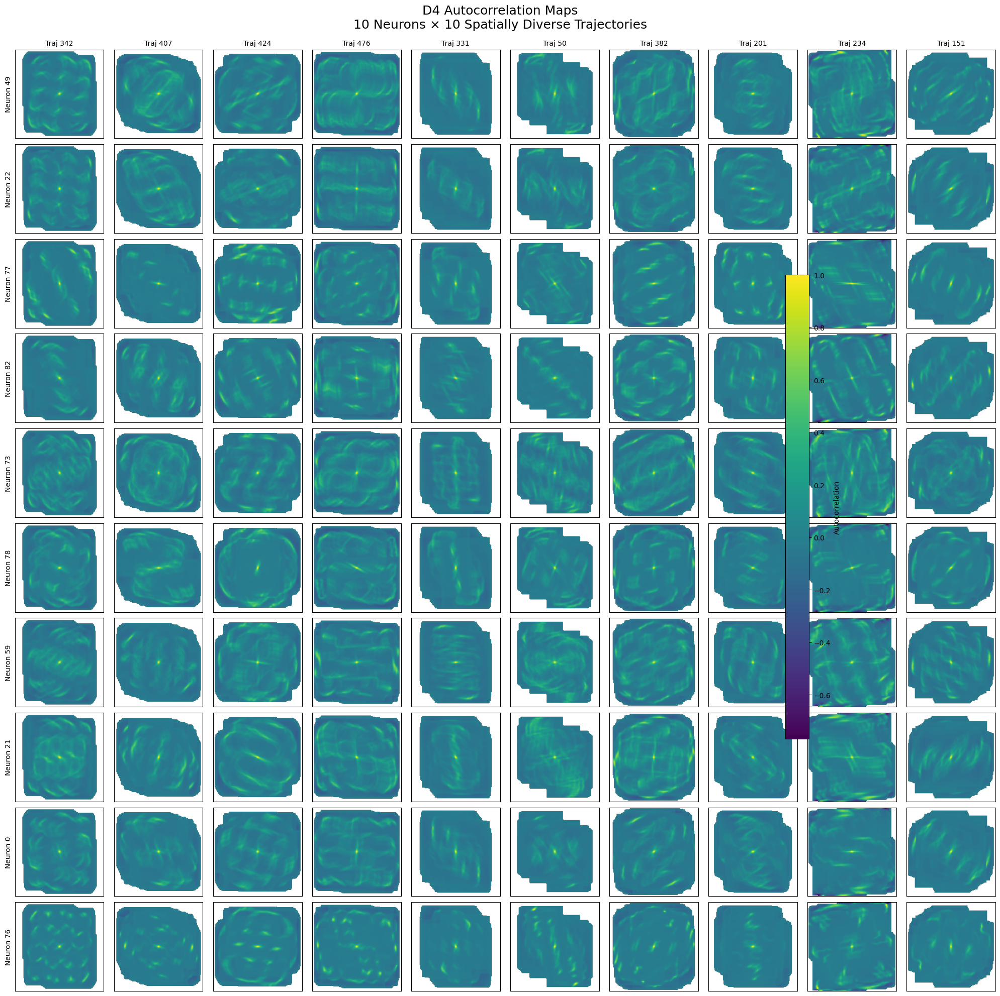

In [37]:
# ============================================================
# D4 — 10 NEURONS × 10 TRAJECTORIES
# AUTOCORRELATION MAPS
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# Neurons we want to inspect
# ------------------------------------------------------------

selected_neurons = [
    49,
    22,
    77,
    82,
    73,
    78,
    59,
    21,
    0,
    76,
]

# ------------------------------------------------------------
# Check that autocorr_maps exists
# ------------------------------------------------------------

print("Autocorrelation data shape:", autocorr_maps.shape)

# ------------------------------------------------------------
# Common color scale
# ------------------------------------------------------------

vmin = np.nanmin(
    autocorr_maps[selected_neurons]
)

vmax = np.nanmax(
    autocorr_maps[selected_neurons]
)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, axes = plt.subplots(
    len(selected_neurons),
    len(selected_trajectories),
    figsize=(20, 20)
)

for row, neuron in enumerate(selected_neurons):

    for col, trajectory in enumerate(
        selected_trajectories
    ):

        ax = axes[row, col]

        # ----------------------------------------------------
        # Get autocorrelation map
        # ----------------------------------------------------

        # col corresponds to the position of the trajectory
        # inside selected_trajectories

        ac_map = autocorr_maps[
            neuron,
            col
        ]

        ax.imshow(
            ac_map,
            origin="lower",
            cmap="viridis",
            vmin=vmin,
            vmax=vmax,
        )

        # ----------------------------------------------------
        # Titles
        # ----------------------------------------------------

        if row == 0:
            ax.set_title(
                f"Traj {trajectory}",
                fontsize=10
            )

        if col == 0:
            ax.set_ylabel(
                f"Neuron {neuron}",
                fontsize=10
            )

        ax.set_xticks([])
        ax.set_yticks([])

# ------------------------------------------------------------
# Overall title
# ------------------------------------------------------------

fig.suptitle(
    "D4 Autocorrelation Maps\n"
    "10 Neurons × 10 Spatially Diverse Trajectories",
    fontsize=18,
    y=0.995
)

# ------------------------------------------------------------
# Colorbar
# ------------------------------------------------------------

sm = plt.cm.ScalarMappable(
    cmap="viridis",
    norm=plt.Normalize(
        vmin=vmin,
        vmax=vmax
    )
)

sm.set_array([])

fig.colorbar(
    sm,
    ax=axes.ravel().tolist(),
    shrink=0.6,
    label="Autocorrelation",
)

plt.tight_layout()
plt.show()

D4 neurons exhibited spatially structured autocorrelation patterns across trajectories, but visual inspection did not reveal a robust and consistent six-fold periodic structure characteristic of canonical grid-cell representations. Several neurons showed ring-like, elongated, or irregular autocorrelation patterns, suggesting that the high single-trajectory grid scores may not represent stable grid-like organization across trajectories.


In [38]:
# ============================================================
# SIX-FOLD SYMMETRY ANALYSIS
# ============================================================

import numpy as np
import pandas as pd
from scipy.ndimage import rotate


def safe_correlation(a, b):
    """
    Pearson correlation between two arrays,
    ignoring NaNs.
    """

    a = np.asarray(a).ravel()
    b = np.asarray(b).ravel()

    valid = (
        np.isfinite(a)
        & np.isfinite(b)
    )

    if np.sum(valid) < 20:
        return np.nan

    a = a[valid]
    b = b[valid]

    if np.std(a) < 1e-12 or np.std(b) < 1e-12:
        return np.nan

    return np.corrcoef(a, b)[0, 1]


def rotational_correlation(
    autocorr,
    angle,
    inner_fraction=0.15,
    outer_fraction=0.75,
):
    """
    Correlation between an autocorrelation map and
    its rotated version.

    The central peak is excluded so that it does not
    dominate the rotational symmetry measurement.
    """

    ac = np.asarray(
        autocorr,
        dtype=np.float64
    )

    h, w = ac.shape

    cy = (h - 1) / 2
    cx = (w - 1) / 2

    yy, xx = np.indices(ac.shape)

    radius = np.sqrt(
        (xx - cx) ** 2
        +
        (yy - cy) ** 2
    )

    max_radius = min(
        cx,
        cy
    )

    inner = inner_fraction * max_radius
    outer = outer_fraction * max_radius

    annulus = (
        (radius >= inner)
        &
        (radius <= outer)
    )

    # --------------------------------------------------------
    # Rotate map
    # --------------------------------------------------------

    rotated = rotate(
        ac,
        angle=angle,
        reshape=False,
        order=1,
        mode="constant",
        cval=np.nan,
    )

    valid = (
        annulus
        &
        np.isfinite(ac)
        &
        np.isfinite(rotated)
    )

    if np.sum(valid) < 20:
        return np.nan

    return safe_correlation(
        ac[valid],
        rotated[valid]
    )


def sixfold_harmonic_strength(
    autocorr,
    inner_fraction=0.15,
    outer_fraction=0.75,
    n_angles=360,
):
    """
    Measures sixfold angular structure using the
    magnitude of the 6th angular Fourier component.

    Higher = stronger sixfold angular modulation.
    """

    ac = np.asarray(
        autocorr,
        dtype=np.float64
    )

    h, w = ac.shape

    cy = (h - 1) / 2
    cx = (w - 1) / 2

    yy, xx = np.indices(ac.shape)

    dx = xx - cx
    dy = yy - cy

    radius = np.sqrt(
        dx**2 + dy**2
    )

    theta = np.arctan2(
        dy,
        dx
    )

    max_radius = min(
        cx,
        cy
    )

    inner = inner_fraction * max_radius
    outer = outer_fraction * max_radius

    valid = (
        (radius >= inner)
        &
        (radius <= outer)
        &
        np.isfinite(ac)
    )

    if np.sum(valid) < 20:
        return np.nan

    values = ac[valid]
    angles = theta[valid]

    # --------------------------------------------------------
    # Remove overall mean so broad rings do not dominate
    # --------------------------------------------------------

    values = values - np.mean(values)

    denominator = np.sum(
        values ** 2
    )

    if denominator < 1e-12:
        return np.nan

    # --------------------------------------------------------
    # Sixth angular harmonic
    # --------------------------------------------------------

    harmonic = np.sum(
        values
        * np.exp(
            -1j * 6 * angles
        )
    )

    # Normalized strength
    strength = (
        np.abs(harmonic)
        /
        np.sqrt(
            denominator
            * len(values)
        )
    )

    return strength

In [39]:
# ============================================================
# TEST SIX-FOLD METRICS
# ============================================================

test_neuron = 49

print(
    f"Neuron {test_neuron}"
)

for t_idx, trajectory in enumerate(
    selected_trajectories
):

    ac = autocorr_maps[
        test_neuron,
        t_idx
    ]

    s60 = rotational_correlation(
        ac,
        60
    )

    s90 = rotational_correlation(
        ac,
        90
    )

    s120 = rotational_correlation(
        ac,
        120
    )

    harmonic6 = sixfold_harmonic_strength(
        ac
    )

    print(
        f"Traj {trajectory:3d} | "
        f"60° = {s60: .3f} | "
        f"90° = {s90: .3f} | "
        f"120° = {s120: .3f} | "
        f"6-fold = {harmonic6: .3f}"
    )

Neuron 49
Traj 342 | 60° = -0.104 | 90° =  0.069 | 120° = -0.104 | 6-fold =  0.101
Traj 407 | 60° = -0.293 | 90° = -0.114 | 120° = -0.293 | 6-fold =  0.056
Traj 424 | 60° =  0.049 | 90° =  0.011 | 120° =  0.051 | 6-fold =  0.111
Traj 476 | 60° = -0.120 | 90° =  0.066 | 120° = -0.122 | 6-fold =  0.162
Traj 331 | 60° = -0.032 | 90° =  0.011 | 120° = -0.033 | 6-fold =  0.106
Traj  50 | 60° = -0.009 | 90° = -0.051 | 120° = -0.008 | 6-fold =  0.108
Traj 382 | 60° =  0.225 | 90° =  0.071 | 120° =  0.226 | 6-fold =  0.125
Traj 201 | 60° =  0.027 | 90° =  0.168 | 120° =  0.026 | 6-fold =  0.076
Traj 234 | 60° =  0.015 | 90° = -0.215 | 120° =  0.017 | 6-fold =  0.043
Traj 151 | 60° =  0.030 | 90° =  0.039 | 120° =  0.030 | 6-fold =  0.088


In [40]:
# ============================================================
# SIX-FOLD ANALYSIS — ALL 100 D4 NEURONS
# ============================================================

results = []

n_neurons = autocorr_maps.shape[0]
n_trajectories = autocorr_maps.shape[1]

print(f"Neurons: {n_neurons}")
print(f"Trajectories: {n_trajectories}")

for neuron in range(n_neurons):

    for t_idx, trajectory in enumerate(selected_trajectories):

        ac = autocorr_maps[neuron, t_idx]

        s60 = rotational_correlation(ac, 60)
        s90 = rotational_correlation(ac, 90)
        s120 = rotational_correlation(ac, 120)

        harmonic6 = sixfold_harmonic_strength(ac)

        if np.isfinite(s60) and np.isfinite(s90):
            excess = s60 - s90
        else:
            excess = np.nan

        results.append({
            "Neuron": neuron,
            "Trajectory": trajectory,
            "60deg": s60,
            "90deg": s90,
            "120deg": s120,
            "Sixfold Harmonic": harmonic6,
            "Sixfold Excess": excess
        })

sixfold_df = pd.DataFrame(results)

print("\nFinished.")
print("Shape:", sixfold_df.shape)

Neurons: 100
Trajectories: 10

Finished.
Shape: (1000, 7)


In [41]:
# ============================================================
# PER-NEURON SUMMARY
# ============================================================

sixfold_summary = (
    sixfold_df
    .groupby("Neuron")
    .agg(
        Mean_60deg=("60deg", "mean"),
        Mean_90deg=("90deg", "mean"),
        Mean_120deg=("120deg", "mean"),
        Mean_6fold=("Sixfold Harmonic", "mean"),
        Mean_Excess=("Sixfold Excess", "mean"),
        Std_6fold=("Sixfold Harmonic", "std"),
    )
    .reset_index()
)

# ------------------------------------------------------------
# Count trajectories showing positive sixfold excess
# ------------------------------------------------------------

positive_counts = (
    sixfold_df
    .groupby("Neuron")["Sixfold Excess"]
    .apply(lambda x: np.sum(x > 0))
    .reset_index(
        name="Positive_60minus90"
    )
)

# ------------------------------------------------------------
# Count stronger trajectories
# ------------------------------------------------------------

strong_counts = (
    sixfold_df
    .groupby("Neuron")["Sixfold Excess"]
    .apply(lambda x: np.sum(x > 0.10))
    .reset_index(
        name="Strong_6fold"
    )
)

sixfold_summary = sixfold_summary.merge(
    positive_counts,
    on="Neuron"
)

sixfold_summary = sixfold_summary.merge(
    strong_counts,
    on="Neuron"
)

# ------------------------------------------------------------
# Rank primarily by sixfold harmonic
# ------------------------------------------------------------

sixfold_summary = sixfold_summary.sort_values(
    ["Mean_6fold", "Mean_Excess"],
    ascending=False
).reset_index(drop=True)

display(
    sixfold_summary.head(20)
)

,Neuron,Mean_60deg,Mean_90deg,Mean_120deg,Mean_6fold,Mean_Excess,Std_6fold,Positive_60minus90,Strong_6fold
0,20,-0.012199,-0.055838,-0.011761,0.182865,0.043638,0.069810,8,4
1,84,-0.056907,-0.128386,-0.056770,0.176247,0.071480,0.057672,5,4
2,14,0.066120,-0.054987,0.065841,0.175036,0.121107,0.107665,8,4
3,10,0.023759,-0.089344,0.023674,0.174514,0.113102,0.046458,6,4
4,39,-0.014331,-0.039412,-0.014865,0.171679,0.025081,0.053586,6,2
5,82,-0.075825,-0.100222,-0.076095,0.167850,0.024397,0.090727,4,3
6,48,0.012216,-0.058040,0.012653,0.167299,0.070256,0.064128,7,5
7,53,0.000606,-0.026417,0.000594,0.166604,0.027023,0.077835,5,3
8,88,-0.093818,-0.123602,-0.094878,0.164690,0.029784,0.050716,5,4
9,41,-0.020994,-0.060118,-0.021499,0.162085,0.039124,0.078344,4,4


C:\Users\ALL AtoZ\AppData\Local\Temp\ipykernel_8396\3077972707.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


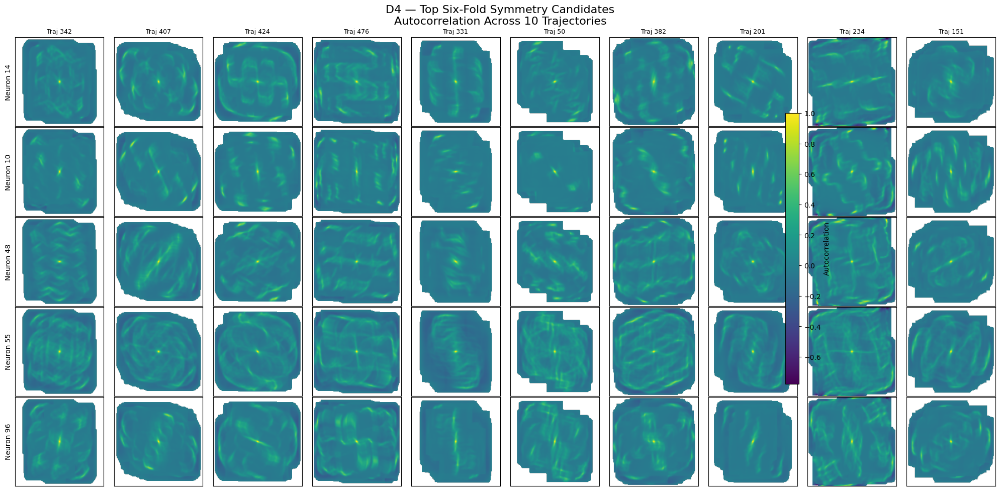

In [42]:
# ============================================================
# TOP FIVE SIX-FOLD CANDIDATES — D4
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

selected_neurons = [14, 10, 48, 55, 96]

fig, axes = plt.subplots(
    5,
    10,
    figsize=(20, 10)
)

subset = autocorr_maps[selected_neurons]

vmin = np.nanmin(subset)
vmax = np.nanmax(subset)

for row, neuron in enumerate(selected_neurons):

    for col, trajectory in enumerate(selected_trajectories):

        ax = axes[row, col]

        ax.imshow(
            autocorr_maps[neuron, col],
            origin="lower",
            cmap="viridis",
            vmin=vmin,
            vmax=vmax
        )

        if row == 0:
            ax.set_title(
                f"Traj {trajectory}",
                fontsize=9
            )

        if col == 0:
            ax.set_ylabel(
                f"Neuron {neuron}",
                fontsize=10
            )

        ax.set_xticks([])
        ax.set_yticks([])

fig.suptitle(
    "D4 — Top Six-Fold Symmetry Candidates\n"
    "Autocorrelation Across 10 Trajectories",
    fontsize=16
)

sm = plt.cm.ScalarMappable(
    cmap="viridis",
    norm=plt.Normalize(vmin=vmin, vmax=vmax)
)

sm.set_array([])

fig.colorbar(
    sm,
    ax=axes.ravel().tolist(),
    shrink=0.7,
    label="Autocorrelation"
)

plt.tight_layout()
plt.show()

In [43]:
# ============================================================
# FORMAL GRID-SCORE SCREEN
# D4: 8 CANDIDATE NEURONS × 10 TRAJECTORIES
# ============================================================

import numpy as np
import pandas as pd
import time

candidate_neurons = [
    14, 10, 48, 55, 96, 20, 84, 73
]

print("=" * 70)
print("D4 FORMAL GRID-SCORE SCREEN")
print("=" * 70)

actual_results = []

start_total = time.time()

for neuron in candidate_neurons:

    print(f"\nNeuron {neuron}")

    for t_idx, trajectory in enumerate(selected_trajectories):

        autocorr = autocorr_maps[
            neuron,
            t_idx
        ]

        # ----------------------------------------------------
        # Find centre of autocorrelation map
        # ----------------------------------------------------

        centre = centre_peak(autocorr)

        # ----------------------------------------------------
        # Find first ring radius
        # ----------------------------------------------------

        radius = first_ring_radius(
            autocorr,
            centre
        )

        if radius is None or not np.isfinite(radius):

            print(
                f"  Traj {trajectory:3d} | "
                f"No valid radius"
            )

            actual_results.append({
                "Neuron": neuron,
                "Trajectory": trajectory,
                "Grid Score": np.nan,
                "Radius": np.nan,
                "Peaks": np.nan,
            })

            continue

        # ----------------------------------------------------
        # Build annulus
        #
        # Use the first-ring radius to define the annulus.
        # ----------------------------------------------------

        inner_radius = radius * 0.5
        outer_radius = radius * 1.5

        # ----------------------------------------------------
        # Calculate grid score
        # ----------------------------------------------------

        result = compute_grid_score(
            autocorr,
            inner_radius,
            outer_radius
        )

        # ----------------------------------------------------
        # Extract result
        # ----------------------------------------------------

        if isinstance(result, dict):

            score = result.get(
                "grid_score",
                result.get(
                    "score",
                    np.nan
                )
            )

            peaks = result.get(
                "num_peaks",
                result.get(
                    "peaks",
                    np.nan
                )
            )

        else:

            score = result
            peaks = np.nan

        actual_results.append({

            "Neuron": neuron,

            "Trajectory": trajectory,

            "Grid Score": score,

            "Radius": radius,

            "Peaks": peaks,

        })

        print(
            f"  Traj {trajectory:3d} | "
            f"Radius = {radius:6.2f} | "
            f"Grid Score = {score: .4f}"
        )


actual_grid_df = pd.DataFrame(
    actual_results
)

elapsed = time.time() - start_total

print("\n" + "=" * 70)
print(
    f"Finished in {elapsed:.1f} seconds"
)
print("=" * 70)

display(actual_grid_df)

D4 FORMAL GRID-SCORE SCREEN

Neuron 14


TypeError: centre_peak() missing 1 required positional argument: 'shape'

In [ ]:
# ============================================================
# FORMAL GRID-SCORE SCREEN
# D4 — 8 CANDIDATE NEURONS × 10 TRAJECTORIES
# ============================================================

import numpy as np
import pandas as pd
import time

candidate_neurons = [
    14, 10, 48, 55, 96, 20, 84, 73
]

print("=" * 70)
print("D4 FORMAL GRID-SCORE SCREEN")
print("=" * 70)

actual_results = []

start_total = time.time()

for neuron in candidate_neurons:

    print(f"\nNeuron {neuron}")

    for t_idx, trajectory in enumerate(
        selected_trajectories
    ):

        autocorr = autocorr_maps[
            neuron,
            t_idx
        ]

        # ----------------------------------------------------
        # 1. Detect peaks in autocorrelation
        # ----------------------------------------------------

        peaks = detect_autocorr_peaks(
            autocorr,
            threshold=0.1,
            neighbourhood=5
        )

        # ----------------------------------------------------
        # Make sure we have enough peaks
        # ----------------------------------------------------

        if peaks is None or len(peaks) < 3:

            print(
                f"  Traj {trajectory:3d} | "
                f"Not enough peaks ({len(peaks) if peaks is not None else 0})"
            )

            actual_results.append({
                "Neuron": neuron,
                "Trajectory": trajectory,
                "Grid Score": np.nan,
                "Radius": np.nan,
                "Peaks": 0 if peaks is None else len(peaks),
            })

            continue

        # ----------------------------------------------------
        # 2. Find centre peak
        # ----------------------------------------------------

        centre = centre_peak(
            peaks,
            autocorr.shape
        )

        # ----------------------------------------------------
        # 3. Find first ring radius
        # ----------------------------------------------------

        radius = first_ring_radius(
            peaks,
            centre,
            min_radius=10
        )

        if radius is None or not np.isfinite(radius):

            print(
                f"  Traj {trajectory:3d} | "
                f"No valid ring radius | "
                f"Peaks = {len(peaks)}"
            )

            actual_results.append({
                "Neuron": neuron,
                "Trajectory": trajectory,
                "Grid Score": np.nan,
                "Radius": np.nan,
                "Peaks": len(peaks),
            })

            continue

        # ----------------------------------------------------
        # 4. Define annulus
        # ----------------------------------------------------

        inner_radius = radius * 0.5
        outer_radius = radius * 1.5

        # ----------------------------------------------------
        # 5. Calculate formal grid score
        # ----------------------------------------------------

        result = compute_grid_score(
            autocorr,
            inner_radius,
            outer_radius
        )
        # ----------------------------------------------------
        # Extract grid score from result
        # ----------------------------------------------------

        if isinstance(result, dict):

            score = result.get(
                "grid_score",
                result.get(
                    "score",
                    np.nan
                )
            )

        elif isinstance(result, tuple):

            # Your compute_grid_score() returns a tuple.
            # Print it once so we can see its structure.
            print("    compute_grid_score returned:", result)

            # The first element is assumed to be the grid score
            score = result[0]

        else:

            score = result


        
        actual_results.append({

            "Neuron": neuron,

            "Trajectory": trajectory,

            "Grid Score": score,

            "Radius": radius,

            "Peaks": len(peaks),

        })

        print(
            f"  Traj {trajectory:3d} | "
            f"Score = {score: .4f} | "
            f"Radius = {radius:6.2f} | "
            f"Peaks = {len(peaks)}"
        )


# ============================================================
# Convert to dataframe
# ============================================================

actual_grid_df = pd.DataFrame(
    actual_results
)

elapsed = time.time() - start_total

print("\n" + "=" * 70)
print(
    f"Finished in {elapsed:.1f} seconds"
)
print("=" * 70)

display(
    actual_grid_df
)

D4 FORMAL GRID-SCORE SCREEN

Neuron 14
    compute_grid_score returned: (np.float64(0.06377460013403724), {30: np.float64(-0.024304945015508752), 60: np.float64(-0.03008933115418442), 90: np.float64(-0.2376267394771419), 120: np.float64(-0.03344713387217212), 150: np.float64(-0.024696813448995856)})
  Traj 342 | Score =  0.0638 | Radius =  24.84 | Peaks = 45
    compute_grid_score returned: (np.float64(0.1582697479863372), {30: np.float64(0.03817821206816027), 60: np.float64(0.13545488134589867), 90: np.float64(-0.14529142330493772), 120: np.float64(0.13564008733457808), 150: np.float64(0.038946420298481)})
  Traj 407 | Score =  0.1583 | Radius =  39.66 | Peaks = 25
    compute_grid_score returned: (np.float64(0.7783925632745823), {30: np.float64(-0.3226877584716836), 60: np.float64(0.38518839757019957), 90: np.float64(-0.5355631700509902), 120: np.float64(0.38228981745709384), 150: np.float64(-0.3257094387601331)})
  Traj 424 | Score =  0.7784 | Radius =  28.46 | Peaks = 51
    comput

,Neuron,Trajectory,Grid Score,Radius,Peaks
0,14,342,0.063775,24.839485,45
1,14,407,0.158270,39.661064,25
2,14,424,0.778393,28.460499,51
3,14,476,-0.265892,16.031220,67
4,14,331,0.555802,41.261287,33
...,...,...,...,...,...
75,73,50,-0.047097,14.122400,75
76,73,382,-0.039880,28.442925,66
77,73,201,-0.011463,37.018663,27
78,73,234,-0.276059,17.888544,99


In [ ]:
# Test exactly what compute_grid_score returns

neuron = 14
t_idx = 0

autocorr = autocorr_maps[neuron, t_idx]

peaks = detect_autocorr_peaks(
    autocorr,
    threshold=0.1,
    neighbourhood=5
)

centre = centre_peak(
    peaks,
    autocorr.shape
)

radius = first_ring_radius(
    peaks,
    centre,
    min_radius=10
)

inner_radius = radius * 0.5
outer_radius = radius * 1.5

result = compute_grid_score(
    autocorr,
    inner_radius,
    outer_radius
)

print("Result:")
print(result)

print("\nType:")
print(type(result))

if isinstance(result, tuple):
    print("\nTuple length:", len(result))

    for i, value in enumerate(result):
        print(
            f"Element {i}: "
            f"type={type(value)}, "
            f"value={value}"
        )

Result:
(np.float64(0.06377460013403724), {30: np.float64(-0.024304945015508752), 60: np.float64(-0.03008933115418442), 90: np.float64(-0.2376267394771419), 120: np.float64(-0.03344713387217212), 150: np.float64(-0.024696813448995856)})

Type:
<class 'tuple'>

Tuple length: 2
Element 0: type=<class 'numpy.float64'>, value=0.06377460013403724
Element 1: type=<class 'dict'>, value={30: np.float64(-0.024304945015508752), 60: np.float64(-0.03008933115418442), 90: np.float64(-0.2376267394771419), 120: np.float64(-0.03344713387217212), 150: np.float64(-0.024696813448995856)}


In [ ]:
# ============================================================
# D4 — FORMAL GRID SCORE SCREEN
# 8 CANDIDATE NEURONS × 10 TRAJECTORIES
# ============================================================

import numpy as np
import pandas as pd
import time

candidate_neurons = [
    14, 10, 48, 55, 96, 20, 84, 73
]

print("=" * 70)
print("D4 FORMAL GRID-SCORE SCREEN")
print("=" * 70)

actual_results = []

start_total = time.time()

for neuron in candidate_neurons:

    print(f"\nNeuron {neuron}")

    for t_idx, trajectory in enumerate(
        selected_trajectories
    ):

        # ----------------------------------------------------
        # Existing autocorrelation map
        # ----------------------------------------------------

        autocorr = autocorr_maps[
            neuron,
            t_idx
        ]

        # ----------------------------------------------------
        # Detect autocorrelation peaks
        # ----------------------------------------------------

        peaks = detect_autocorr_peaks(
            autocorr,
            threshold=0.1,
            neighbourhood=5
        )

        if peaks is None or len(peaks) < 3:

            print(
                f"  Traj {trajectory:3d} | "
                f"Not enough peaks"
            )

            actual_results.append({
                "Neuron": neuron,
                "Trajectory": trajectory,
                "Grid Score": np.nan,
                "Radius": np.nan,
                "Peaks": 0 if peaks is None else len(peaks),
                "30°": np.nan,
                "60°": np.nan,
                "90°": np.nan,
                "120°": np.nan,
                "150°": np.nan,
            })

            continue

        # ----------------------------------------------------
        # Find centre
        # ----------------------------------------------------

        centre = centre_peak(
            peaks,
            autocorr.shape
        )

        # ----------------------------------------------------
        # Find first ring radius
        # ----------------------------------------------------

        radius = first_ring_radius(
            peaks,
            centre,
            min_radius=10
        )

        if radius is None or not np.isfinite(radius):

            print(
                f"  Traj {trajectory:3d} | "
                f"No valid radius"
            )

            actual_results.append({
                "Neuron": neuron,
                "Trajectory": trajectory,
                "Grid Score": np.nan,
                "Radius": np.nan,
                "Peaks": len(peaks),
                "30°": np.nan,
                "60°": np.nan,
                "90°": np.nan,
                "120°": np.nan,
                "150°": np.nan,
            })

            continue

        # ----------------------------------------------------
        # Define annulus
        # ----------------------------------------------------

        inner_radius = radius * 0.5
        outer_radius = radius * 1.5

        # ----------------------------------------------------
        # Compute grid score
        # ----------------------------------------------------

        result = compute_grid_score(
            autocorr,
            inner_radius,
            outer_radius
        )

        # First element = grid score
        grid_score = float(result[0])

        # Second element = rotational correlations
        correlations = result[1]

        actual_results.append({

            "Neuron": neuron,

            "Trajectory": trajectory,

            "Grid Score": grid_score,

            "Radius": radius,

            "Peaks": len(peaks),

            "30°": correlations.get(30, np.nan),

            "60°": correlations.get(60, np.nan),

            "90°": correlations.get(90, np.nan),

            "120°": correlations.get(120, np.nan),

            "150°": correlations.get(150, np.nan),

        })

        print(
            f"  Traj {trajectory:3d} | "
            f"Score = {grid_score: .4f} | "
            f"Radius = {radius:6.2f} | "
            f"Peaks = {len(peaks)}"
        )


# ============================================================
# Convert to dataframe
# ============================================================

actual_grid_df = pd.DataFrame(
    actual_results
)

elapsed = time.time() - start_total

print("\n" + "=" * 70)
print(
    f"Finished in {elapsed:.1f} seconds"
)
print("=" * 70)

display(actual_grid_df)

D4 FORMAL GRID-SCORE SCREEN

Neuron 14
  Traj 342 | Score =  0.0638 | Radius =  24.84 | Peaks = 45
  Traj 407 | Score =  0.1583 | Radius =  39.66 | Peaks = 25
  Traj 424 | Score =  0.7784 | Radius =  28.46 | Peaks = 51
  Traj 476 | Score = -0.2659 | Radius =  16.03 | Peaks = 67
  Traj 331 | Score =  0.5558 | Radius =  41.26 | Peaks = 33
  Traj  50 | Score = -0.0083 | Radius =  21.21 | Peaks = 31
  Traj 382 | Score = -0.0271 | Radius =  30.04 | Peaks = 41
  Traj 201 | Score = -0.1610 | Radius =  13.78 | Peaks = 29
  Traj 234 | Score =  0.1686 | Radius =  50.15 | Peaks = 52
  Traj 151 | Score = -0.2509 | Radius =  21.58 | Peaks = 33

Neuron 10
  Traj 342 | Score =  0.1248 | Radius =  43.01 | Peaks = 23
  Traj 407 | Score =  0.1942 | Radius =  35.74 | Peaks = 21
  Traj 424 | Score =  0.1448 | Radius =  37.66 | Peaks = 25
  Traj 476 | Score =  0.2205 | Radius =  37.34 | Peaks = 51
  Traj 331 | Score = -0.1222 | Radius =  32.39 | Peaks = 11
  Traj  50 | Score =  0.0274 | Radius =  48.88 | P

,Neuron,Trajectory,Grid Score,Radius,Peaks,30°,60°,90°,120°,150°
0,14,342,0.063775,24.839485,45,-0.024305,-0.030089,-0.237627,-0.033447,-0.024697
1,14,407,0.158270,39.661064,25,0.038178,0.135455,-0.145291,0.135640,0.038946
2,14,424,0.778393,28.460499,51,-0.322688,0.385188,-0.535563,0.382290,-0.325709
3,14,476,-0.265892,16.031220,67,0.011963,-0.229208,0.084823,-0.231476,0.009864
4,14,331,0.555802,41.261287,33,-0.195350,0.370692,-0.165170,0.370958,-0.194410
...,...,...,...,...,...,...,...,...,...,...
75,73,50,-0.047097,14.122400,75,0.144793,0.184237,0.441219,0.200583,0.132508
76,73,382,-0.039880,28.442925,66,-0.112764,-0.117876,-0.008460,-0.114853,-0.108229
77,73,201,-0.011463,37.018663,27,-0.006845,-0.069849,-0.159846,-0.068641,-0.006655
78,73,234,-0.276059,17.888544,99,0.138416,-0.252918,-0.212769,-0.252830,0.143909


In [ ]:
# ============================================================
# SUMMARY ACROSS THE 10 TRAJECTORIES
# ============================================================

grid_summary = (
    actual_grid_df
    .groupby("Neuron")
    .agg(

        Mean_Grid_Score=(
            "Grid Score",
            "mean"
        ),

        Std_Grid_Score=(
            "Grid Score",
            "std"
        ),

        Max_Grid_Score=(
            "Grid Score",
            "max"
        ),

        Min_Grid_Score=(
            "Grid Score",
            "min"
        ),

        Mean_60=(
            "60°",
            "mean"
        ),

        Mean_90=(
            "90°",
            "mean"
        ),

        Mean_120=(
            "120°",
            "mean"
        ),

        Positive_Trajectories=(
            "Grid Score",
            lambda x: np.sum(x > 0)
        ),

        Strong_Trajectories=(
            "Grid Score",
            lambda x: np.sum(x > 0.2)
        ),
    )
    .reset_index()
)

grid_summary = grid_summary.sort_values(
    "Mean_Grid_Score",
    ascending=False
).reset_index(drop=True)

display(grid_summary)

,Neuron,Mean_Grid_Score,Std_Grid_Score,Max_Grid_Score,Min_Grid_Score,Mean_60,Mean_90,Mean_120,Positive_Trajectories,Strong_Trajectories
0,20,0.109315,0.272206,0.537844,-0.190102,0.051621,-0.143812,0.053105,6,4
1,14,0.101169,0.338357,0.778393,-0.265892,0.025129,-0.106795,0.023417,5,2
2,10,0.064884,0.183401,0.400641,-0.181676,-0.000659,-0.095315,0.000537,6,2
3,48,-0.059596,0.215185,0.347727,-0.360679,-0.031919,-0.154563,-0.032773,3,1
4,55,-0.069708,0.201485,0.229055,-0.264204,-0.062897,-0.104236,-0.063480,3,1
5,73,-0.073460,0.112047,0.091485,-0.276059,-0.053505,-0.014226,-0.052603,2,0
6,84,-0.102595,0.182448,0.289534,-0.289071,-0.128088,-0.213549,-0.128973,2,1
7,96,-0.127230,0.132247,0.053138,-0.419821,-0.048150,-0.107638,-0.047734,1,0


In [ ]:
print("positions:", positions.shape)
print("activations:", activations.shape)
print("autocorr_maps:", autocorr_maps.shape)
print("selected trajectories:", selected_trajectories)

print("\nCandidate neurons:")
print([20, 14, 10])

positions: (500, 450, 2)
activations: (500, 450, 100)
autocorr_maps: (100, 10, 159, 159)
selected trajectories: [342, 407, 424, 476, 331, 50, 382, 201, 234, 151]

Candidate neurons:
[20, 14, 10]


In [ ]:
# ============================================================
# D4 GRID-SCORE SIGNIFICANCE TEST
# 3 NEURONS × 10 TRAJECTORIES × 100 SHUFFLES
#
# Null model:
# Randomly permute autocorrelation values within the
# grid-score annulus while preserving the radial structure.
# ============================================================

import numpy as np
import pandas as pd
import time

candidate_neurons = [20, 14, 10]
N_SHUFFLES = 100

shuffle_results = []

start_total = time.time()

print("=" * 75)
print("D4 GRID-SCORE SIGNIFICANCE TEST")
print("=" * 75)
print(f"Neurons: {candidate_neurons}")
print(f"Trajectories: {selected_trajectories}")
print(f"Shuffles per neuron × trajectory: {N_SHUFFLES}")
print(
    f"Total shuffle grid-score calculations: "
    f"{len(candidate_neurons) * len(selected_trajectories) * N_SHUFFLES}"
)

for neuron in candidate_neurons:

    print("\n" + "-" * 75)
    print(f"NEURON {neuron}")
    print("-" * 75)

    for t_idx, trajectory in enumerate(selected_trajectories):

        autocorr = autocorr_maps[
            neuron,
            t_idx
        ].copy()

        # ----------------------------------------------------
        # Detect peaks
        # ----------------------------------------------------

        peaks = detect_autocorr_peaks(
            autocorr,
            threshold=0.1,
            neighbourhood=5
        )

        if peaks is None or len(peaks) < 3:

            print(
                f"Traj {trajectory:3d} | "
                f"SKIPPED — insufficient peaks"
            )
            continue

        # ----------------------------------------------------
        # Centre
        # ----------------------------------------------------

        centre = centre_peak(
            peaks,
            autocorr.shape
        )

        # ----------------------------------------------------
        # First ring
        # ----------------------------------------------------

        radius = first_ring_radius(
            peaks,
            centre,
            min_radius=10
        )

        if radius is None or not np.isfinite(radius):

            print(
                f"Traj {trajectory:3d} | "
                f"SKIPPED — no valid radius"
            )
            continue

        # ----------------------------------------------------
        # Same annulus used for the actual grid score
        # ----------------------------------------------------

        inner_radius = radius * 0.5
        outer_radius = radius * 1.5

        # ----------------------------------------------------
        # REAL GRID SCORE
        # ----------------------------------------------------

        real_result = compute_grid_score(
            autocorr,
            inner_radius,
            outer_radius
        )

        real_score = float(
            real_result[0]
        )

        # ----------------------------------------------------
        # Build annulus mask
        # ----------------------------------------------------

        yy, xx = np.indices(
            autocorr.shape
        )

        distances = np.sqrt(
            (xx - centre[1]) ** 2 +
            (yy - centre[0]) ** 2
        )

        annulus_mask = (
            (distances >= inner_radius) &
            (distances <= outer_radius) &
            np.isfinite(autocorr)
        )

        annulus_indices = np.where(
            annulus_mask
        )

        annulus_values = autocorr[
            annulus_indices
        ].copy()

        # ----------------------------------------------------
        # SHUFFLES
        # ----------------------------------------------------

        null_scores = []

        for shuffle in range(N_SHUFFLES):

            shuffled_autocorr = autocorr.copy()

            # Randomly rearrange values within annulus
            shuffled_values = np.random.permutation(
                annulus_values
            )

            shuffled_autocorr[
                annulus_indices
            ] = shuffled_values

            # Calculate grid score
            shuffled_result = compute_grid_score(
                shuffled_autocorr,
                inner_radius,
                outer_radius
            )

            shuffled_score = float(
                shuffled_result[0]
            )

            if np.isfinite(shuffled_score):

                null_scores.append(
                    shuffled_score
                )

        null_scores = np.asarray(
            null_scores
        )

        if len(null_scores) == 0:

            print(
                f"Traj {trajectory:3d} | "
                f"No valid shuffle scores"
            )
            continue

        # ----------------------------------------------------
        # Statistics
        # ----------------------------------------------------

        null_mean = np.mean(
            null_scores
        )

        null_std = np.std(
            null_scores
        )

        null_95 = np.percentile(
            null_scores,
            95
        )

        null_99 = np.percentile(
            null_scores,
            99
        )

        # Empirical one-sided p-value
        p_value = (
            1 +
            np.sum(
                null_scores >= real_score
            )
        ) / (
            len(null_scores) + 1
        )

        # Z score
        if null_std > 0:

            z_score = (
                real_score - null_mean
            ) / null_std

        else:

            z_score = np.nan

        significant_05 = (
            real_score > null_95
        )

        significant_01 = (
            real_score > null_99
        )

        shuffle_results.append({

            "Neuron": neuron,

            "Trajectory": trajectory,

            "Real Grid Score": real_score,

            "Shuffle Mean": null_mean,

            "Shuffle Std": null_std,

            "Shuffle 95%": null_95,

            "Shuffle 99%": null_99,

            "Z Score": z_score,

            "Empirical P": p_value,

            "Significant p<0.05": significant_05,

            "Significant p<0.01": significant_01,

            "Radius": radius,

            "Peaks": len(peaks),

        })

        print(
            f"Traj {trajectory:3d} | "
            f"Real = {real_score: .3f} | "
            f"Null = {null_mean: .3f} ± {null_std:.3f} | "
            f"95% = {null_95:.3f} | "
            f"p = {p_value:.3f}"
        )


shuffle_df = pd.DataFrame(
    shuffle_results
)

elapsed = time.time() - start_total

print("\n" + "=" * 75)
print(
    f"Finished in {elapsed:.1f} seconds"
)
print("=" * 75)

display(
    shuffle_df
)

D4 GRID-SCORE SIGNIFICANCE TEST
Neurons: [20, 14, 10]
Trajectories: [342, 407, 424, 476, 331, 50, 382, 201, 234, 151]
Shuffles per neuron × trajectory: 100
Total shuffle grid-score calculations: 3000

---------------------------------------------------------------------------
NEURON 20
---------------------------------------------------------------------------
Traj 342 | Real = -0.156 | Null =  0.000 ± 0.037 | 95% = 0.057 | p = 1.000
Traj 407 | Real =  0.271 | Null = -0.000 ± 0.009 | 95% = 0.016 | p = 0.010
Traj 424 | Real = -0.190 | Null = -0.000 ± 0.008 | 95% = 0.013 | p = 1.000
Traj 476 | Real =  0.078 | Null = -0.000 ± 0.007 | 95% = 0.013 | p = 0.010
Traj 331 | Real =  0.493 | Null =  0.001 ± 0.010 | 95% = 0.018 | p = 0.010
Traj  50 | Real =  0.538 | Null =  0.002 ± 0.021 | 95% = 0.038 | p = 0.010
Traj 382 | Real =  0.091 | Null = -0.001 ± 0.013 | 95% = 0.019 | p = 0.010
Traj 201 | Real =  0.255 | Null =  0.000 ± 0.010 | 95% = 0.017 | p = 0.010
Traj 234 | Real = -0.128 | Null = -0.

,Neuron,Trajectory,Real Grid Score,Shuffle Mean,Shuffle Std,Shuffle 95%,Shuffle 99%,Z Score,Empirical P,Significant p<0.05,Significant p<0.01,Radius,Peaks
0,20,342,-0.155532,0.000107,0.036999,0.057080,0.092594,-4.206510,1.000000,False,False,11.180340,45
1,20,407,0.270560,-0.000066,0.009442,0.015531,0.020138,28.662001,0.009901,True,True,43.640559,23
2,20,424,-0.190102,-0.000090,0.008457,0.013358,0.017336,-22.469126,1.000000,False,False,37.854986,42
3,20,476,0.077885,-0.000327,0.007434,0.013156,0.015289,10.520217,0.009901,True,True,48.388551,49
4,20,331,0.493026,0.000774,0.009631,0.017613,0.022846,51.111365,0.009901,True,True,37.349459,29
5,20,50,0.537844,0.001797,0.021084,0.037583,0.047552,25.424408,0.009901,True,True,17.691806,87
6,20,382,0.090903,-0.000755,0.013184,0.019408,0.027214,6.952274,0.009901,True,True,27.658633,79
7,20,201,0.254549,0.000165,0.009972,0.016710,0.020534,25.510640,0.009901,True,True,40.816663,19
8,20,234,-0.127820,-0.000672,0.016274,0.027649,0.036582,-7.813190,1.000000,False,False,24.041631,91
9,20,151,-0.158164,0.000396,0.010567,0.020144,0.025525,-15.005672,1.000000,False,False,32.893768,51


In [ ]:
# ============================================================
# SUMMARY OF SHUFFLE SIGNIFICANCE
# ============================================================

significance_summary = (
    shuffle_df
    .groupby("Neuron")
    .agg(

        Mean_Real_Score=(
            "Real Grid Score",
            "mean"
        ),

        Std_Real_Score=(
            "Real Grid Score",
            "std"
        ),

        Mean_Shuffle=(
            "Shuffle Mean",
            "mean"
        ),

        Mean_Shuffle_95=(
            "Shuffle 95%",
            "mean"
        ),

        Mean_Z=(
            "Z Score",
            "mean"
        ),

        Median_P=(
            "Empirical P",
            "median"
        ),

        Significant_Trajectories=(
            "Significant p<0.05",
            "sum"
        ),

        Significant_p01=(
            "Significant p<0.01",
            "sum"
        ),

        N_Trajectories=(
            "Trajectory",
            "count"
        ),
    )
    .reset_index()
)

significance_summary = (
    significance_summary
    .sort_values(
        "Mean_Real_Score",
        ascending=False
    )
    .reset_index(drop=True)
)

display(
    significance_summary
)

,Neuron,Mean_Real_Score,Std_Real_Score,Mean_Shuffle,Mean_Shuffle_95,Mean_Z,Median_P,Significant_Trajectories,Significant_p01,N_Trajectories
0,20,0.109315,0.272206,0.000133,0.023823,9.868641,0.009901,6,6,10
1,14,0.101169,0.338357,-0.000040,0.022999,14.950568,0.297030,5,5,10
2,10,0.064884,0.183401,-0.000510,0.015380,6.960015,0.009901,6,6,10


In [ ]:
# ============================================================
# D4 — 1,000-SHUFFLE CONFIRMATION TEST
#
# Candidates:
#   20, 14, 10, 48, 84, 55
#
# 6 neurons × 10 trajectories × 1,000 shuffles
# ============================================================

import numpy as np
import pandas as pd
import time

candidate_neurons = [20, 14, 10, 48, 84, 55]
N_SHUFFLES = 1000

rng = np.random.default_rng(42)

results = []

total_start = time.time()

print("=" * 80)
print("D4 — 1,000 SHUFFLE GRID-SCORE CONFIRMATION")
print("=" * 80)
print(f"Candidates: {candidate_neurons}")
print(f"Trajectories: {selected_trajectories}")
print(f"Shuffles per trajectory: {N_SHUFFLES}")
print(f"Total shuffle tests: {len(candidate_neurons) * 10 * N_SHUFFLES}")
print("=" * 80)


for n_idx, neuron in enumerate(candidate_neurons):

    neuron_start = time.time()

    print(
        f"\n{'='*80}\n"
        f"NEURON {neuron} "
        f"({n_idx+1}/{len(candidate_neurons)})\n"
        f"{'='*80}"
    )

    for t_idx, trajectory in enumerate(selected_trajectories):

        autocorr = autocorr_maps[
            neuron,
            t_idx
        ].copy()

        # ----------------------------------------------------
        # Detect autocorrelation peaks
        # ----------------------------------------------------

        peaks = detect_autocorr_peaks(
            autocorr,
            threshold=0.1,
            neighbourhood=5
        )

        if peaks is None or len(peaks) < 3:

            print(
                f"  Traj {trajectory:3d} | "
                f"SKIPPED — insufficient peaks"
            )
            continue

        # ----------------------------------------------------
        # Find centre
        # ----------------------------------------------------

        centre = centre_peak(
            peaks,
            autocorr.shape
        )

        # ----------------------------------------------------
        # Find first ring
        # ----------------------------------------------------

        radius = first_ring_radius(
            peaks,
            centre,
            min_radius=10
        )

        if radius is None or not np.isfinite(radius):

            print(
                f"  Traj {trajectory:3d} | "
                f"SKIPPED — invalid radius"
            )
            continue

        # ----------------------------------------------------
        # Same annulus as original grid-score calculation
        # ----------------------------------------------------

        inner_radius = radius * 0.5
        outer_radius = radius * 1.5

        # ----------------------------------------------------
        # REAL GRID SCORE
        # ----------------------------------------------------

        real_result = compute_grid_score(
            autocorr,
            inner_radius,
            outer_radius
        )

        real_score = float(real_result[0])

        # ----------------------------------------------------
        # Annulus mask
        # ----------------------------------------------------

        yy, xx = np.indices(
            autocorr.shape
        )

        distances = np.sqrt(
            (xx - centre[1]) ** 2 +
            (yy - centre[0]) ** 2
        )

        annulus_mask = (
            (distances >= inner_radius) &
            (distances <= outer_radius) &
            np.isfinite(autocorr)
        )

        annulus_indices = np.where(
            annulus_mask
        )

        annulus_values = autocorr[
            annulus_indices
        ].copy()

        if len(annulus_values) < 10:

            print(
                f"  Traj {trajectory:3d} | "
                f"SKIPPED — too few annulus values"
            )
            continue

        # ----------------------------------------------------
        # SHUFFLE
        # ----------------------------------------------------

        null_scores = np.empty(
            N_SHUFFLES,
            dtype=float
        )

        for shuffle in range(N_SHUFFLES):

            shuffled_autocorr = autocorr.copy()

            shuffled_values = rng.permutation(
                annulus_values
            )

            shuffled_autocorr[
                annulus_indices
            ] = shuffled_values

            shuffled_result = compute_grid_score(
                shuffled_autocorr,
                inner_radius,
                outer_radius
            )

            null_scores[shuffle] = float(
                shuffled_result[0]
            )

        # Remove invalid values
        null_scores = null_scores[
            np.isfinite(null_scores)
        ]

        # ----------------------------------------------------
        # NULL DISTRIBUTION
        # ----------------------------------------------------

        shuffle_mean = np.mean(
            null_scores
        )

        shuffle_std = np.std(
            null_scores
        )

        shuffle_95 = np.percentile(
            null_scores,
            95
        )

        shuffle_99 = np.percentile(
            null_scores,
            99
        )

        # ----------------------------------------------------
        # EMPIRICAL P-VALUE
        # ----------------------------------------------------

        p_value = (
            1 +
            np.sum(
                null_scores >= real_score
            )
        ) / (
            len(null_scores) + 1
        )

        # ----------------------------------------------------
        # Z SCORE
        # ----------------------------------------------------

        if shuffle_std > 0:

            z_score = (
                real_score - shuffle_mean
            ) / shuffle_std

        else:

            z_score = np.nan

        # ----------------------------------------------------
        # SIGNIFICANCE
        # ----------------------------------------------------

        significant_05 = (
            real_score > shuffle_95
        )

        significant_01 = (
            real_score > shuffle_99
        )

        results.append({

            "Neuron": neuron,
            "Trajectory": trajectory,

            "Real Grid Score": real_score,

            "Shuffle Mean": shuffle_mean,
            "Shuffle Std": shuffle_std,

            "Shuffle 95%": shuffle_95,
            "Shuffle 99%": shuffle_99,

            "Z Score": z_score,
            "Empirical P": p_value,

            "Significant p<0.05": significant_05,
            "Significant p<0.01": significant_01,

            "Radius": radius,
            "Peaks": len(peaks),

            "N Shuffles": len(null_scores)

        })

        print(
            f"  Traj {trajectory:3d} | "
            f"Real = {real_score: .4f} | "
            f"95% = {shuffle_95: .4f} | "
            f"99% = {shuffle_99: .4f} | "
            f"p = {p_value:.4f}"
        )

    print(
        f"\nFinished neuron {neuron} in "
        f"{time.time() - neuron_start:.1f} sec"
    )


results_df = pd.DataFrame(
    results
)

total_time = time.time() - total_start

print("\n" + "=" * 80)
print(
    f"ALL DONE — total time: "
    f"{total_time / 60:.2f} minutes"
)
print("=" * 80)

display(results_df)

D4 — 1,000 SHUFFLE GRID-SCORE CONFIRMATION
Candidates: [20, 14, 10, 48, 84, 55]
Trajectories: [342, 407, 424, 476, 331, 50, 382, 201, 234, 151]
Shuffles per trajectory: 1000
Total shuffle tests: 60000

NEURON 20 (1/6)
  Traj 342 | Real = -0.1555 | 95% =  0.0561 | 99% =  0.0855 | p = 1.0000
  Traj 407 | Real =  0.2706 | 95% =  0.0137 | 99% =  0.0176 | p = 0.0010
  Traj 424 | Real = -0.1901 | 95% =  0.0158 | 99% =  0.0215 | p = 1.0000
  Traj 476 | Real =  0.0779 | 95% =  0.0132 | 99% =  0.0176 | p = 0.0010
  Traj 331 | Real =  0.4930 | 95% =  0.0164 | 99% =  0.0213 | p = 0.0010
  Traj  50 | Real =  0.5378 | 95% =  0.0371 | 99% =  0.0515 | p = 0.0010
  Traj 382 | Real =  0.0909 | 95% =  0.0219 | 99% =  0.0316 | p = 0.0010
  Traj 201 | Real =  0.2545 | 95% =  0.0148 | 99% =  0.0191 | p = 0.0010
  Traj 234 | Real = -0.1278 | 95% =  0.0253 | 99% =  0.0348 | p = 1.0000
  Traj 151 | Real = -0.1582 | 95% =  0.0184 | 99% =  0.0245 | p = 1.0000

Finished neuron 20 in 51.7 sec

NEURON 14 (2/6)
  T

,Neuron,Trajectory,Real Grid Score,Shuffle Mean,Shuffle Std,Shuffle 95%,Shuffle 99%,Z Score,Empirical P,Significant p<0.05,Significant p<0.01,Radius,Peaks,N Shuffles
0,20,342,-0.155532,0.000258,0.033023,0.056072,0.085524,-4.717583,1.000000,False,False,11.180340,45,1000
1,20,407,0.270560,0.000142,0.008036,0.013688,0.017619,33.649147,0.000999,True,True,43.640559,23,1000
2,20,424,-0.190102,-0.000169,0.009484,0.015762,0.021529,-20.027735,1.000000,False,False,37.854986,42,1000
3,20,476,0.077885,0.000335,0.007630,0.013243,0.017603,10.164350,0.000999,True,True,48.388551,49,1000
4,20,331,0.493026,0.000044,0.009640,0.016418,0.021297,51.139565,0.000999,True,True,37.349459,29,1000
5,20,50,0.537844,0.000429,0.020984,0.037115,0.051474,25.610519,0.000999,True,True,17.691806,87,1000
6,20,382,0.090903,-0.000259,0.013345,0.021910,0.031589,6.831206,0.000999,True,True,27.658633,79,1000
7,20,201,0.254549,-0.000067,0.008790,0.014815,0.019135,28.965375,0.000999,True,True,40.816663,19,1000
8,20,234,-0.127820,-0.000222,0.015272,0.025290,0.034754,-8.355059,1.000000,False,False,24.041631,91,1000
9,20,151,-0.158164,-0.000107,0.010796,0.018380,0.024452,-14.640994,1.000000,False,False,32.893768,51,1000


In [ ]:
# ============================================================
# FINAL 6-NEURON SUMMARY
# ============================================================

summary = (
    results_df
    .groupby("Neuron")
    .agg(

        Mean_Real_Score=(
            "Real Grid Score",
            "mean"
        ),

        Median_Real_Score=(
            "Real Grid Score",
            "median"
        ),

        Std_Real_Score=(
            "Real Grid Score",
            "std"
        ),

        Max_Real_Score=(
            "Real Grid Score",
            "max"
        ),

        Mean_Shuffle=(
            "Shuffle Mean",
            "mean"
        ),

        Mean_Shuffle_95=(
            "Shuffle 95%",
            "mean"
        ),

        Mean_Shuffle_99=(
            "Shuffle 99%",
            "mean"
        ),

        Mean_Z=(
            "Z Score",
            "mean"
        ),

        Median_P=(
            "Empirical P",
            "median"
        ),

        Significant_05=(
            "Significant p<0.05",
            "sum"
        ),

        Significant_01=(
            "Significant p<0.01",
            "sum"
        ),

        N_Trajectories=(
            "Trajectory",
            "count"
        )
    )
    .reset_index()
)

summary = summary.sort_values(
    "Mean_Real_Score",
    ascending=False
).reset_index(drop=True)

display(summary)

,Neuron,Mean_Real_Score,Median_Real_Score,Std_Real_Score,Max_Real_Score,Mean_Shuffle,Mean_Shuffle_95,Mean_Shuffle_99,Mean_Z,Median_P,Significant_05,Significant_01,N_Trajectories
0,20,0.109315,0.084394,0.272206,0.537844,0.000038,0.023269,0.032498,10.861879,0.000999,6,6,10
1,14,0.101169,0.027755,0.338357,0.778393,0.000072,0.024394,0.034430,12.976829,0.344156,5,5,10
2,10,0.064884,0.076069,0.183401,0.400641,-0.000102,0.016007,0.023442,7.033590,0.000999,6,6,10
3,48,-0.059596,-0.103578,0.215185,0.347727,0.000136,0.030275,0.042815,-2.115274,1.000000,3,3,10
4,55,-0.069708,-0.130181,0.201485,0.229055,0.000215,0.027944,0.040005,-1.608246,1.000000,3,3,10
5,84,-0.102595,-0.160733,0.182448,0.289534,-0.000217,0.027770,0.039083,-4.748240,1.000000,2,2,10


In [ ]:
# ============================================================
# TRAJECTORY-LEVEL SIGNIFICANCE
# ============================================================

trajectory_table = results_df[
    [
        "Neuron",
        "Trajectory",
        "Real Grid Score",
        "Shuffle 95%",
        "Shuffle 99%",
        "Empirical P",
        "Z Score",
        "Significant p<0.05",
        "Significant p<0.01"
    ]
].sort_values(
    ["Neuron", "Real Grid Score"],
    ascending=[True, False]
)

display(trajectory_table)

,Neuron,Trajectory,Real Grid Score,Shuffle 95%,Shuffle 99%,Empirical P,Z Score,Significant p<0.05,Significant p<0.01
27,10,201,0.400641,0.015319,0.020824,0.000999,42.934117,True,True
23,10,476,0.220461,0.015964,0.022663,0.000999,22.734801,True,True
21,10,407,0.194225,0.016888,0.025444,0.000999,19.057617,True,True
22,10,424,0.144839,0.016059,0.022973,0.000999,14.948861,True,True
20,10,342,0.124783,0.013894,0.020999,0.000999,14.595035,True,True
25,10,50,0.027356,0.012041,0.019656,0.000999,3.409671,True,True
29,10,151,-0.077594,0.018782,0.027574,1.000000,-6.604466,False,False
28,10,234,-0.081948,0.020516,0.029561,1.000000,-6.947921,False,False
24,10,331,-0.122246,0.017369,0.025972,1.000000,-10.889364,False,False
26,10,382,-0.181676,0.013243,0.018749,1.000000,-22.902456,False,False


In [ ]:
# ============================================================
# D4 CANDIDATE VISUALIZATION
# Calculate firing-rate maps for the 6 candidate neurons
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

N_BINS = 80
SIGMA = 1.0
EPS = 1e-12

candidate_neurons = [20, 14, 10, 48, 84, 55]

# Same trajectories used for the grid analysis
selected_trajectories = [
    342, 407, 424, 476, 331,
    50, 382, 201, 234, 151
]

# ------------------------------------------------------------
# Bounds from ALL selected trajectories
# ------------------------------------------------------------

selected_positions = positions[
    selected_trajectories
]

xmin = np.nanmin(selected_positions[:, :, 0])
xmax = np.nanmax(selected_positions[:, :, 0])

ymin = np.nanmin(selected_positions[:, :, 1])
ymax = np.nanmax(selected_positions[:, :, 1])

bounds = (
    xmin,
    xmax,
    ymin,
    ymax
)

print("Bounds:")
print(bounds)


# ------------------------------------------------------------
# Bin edges
# ------------------------------------------------------------

x_edges = np.linspace(
    xmin,
    xmax,
    N_BINS + 1
)

y_edges = np.linspace(
    ymin,
    ymax,
    N_BINS + 1
)


# ------------------------------------------------------------
# Calculate firing-rate maps
# ------------------------------------------------------------

firing_rate_maps = {}

for neuron in candidate_neurons:

    neuron_maps = []

    for trajectory in selected_trajectories:

        pos = positions[
            trajectory
        ]

        activity = activations[
            trajectory,
            :,
            neuron
        ]

        # ----------------------------------------------------
        # Remove invalid samples
        # ----------------------------------------------------

        valid = (
            np.isfinite(pos[:, 0]) &
            np.isfinite(pos[:, 1]) &
            np.isfinite(activity)
        )

        x = pos[valid, 0]
        y = pos[valid, 1]
        a = activity[valid]

        # ----------------------------------------------------
        # Use activation magnitude
        # ----------------------------------------------------

        a = np.abs(a)

        # ----------------------------------------------------
        # Occupancy
        # ----------------------------------------------------

        occupancy, _, _ = np.histogram2d(
            x,
            y,
            bins=[
                x_edges,
                y_edges
            ]
        )

        # ----------------------------------------------------
        # Activity
        # ----------------------------------------------------

        activity_sum, _, _ = np.histogram2d(
            x,
            y,
            bins=[
                x_edges,
                y_edges
            ],
            weights=a
        )

        # ----------------------------------------------------
        # Firing rate
        # ----------------------------------------------------

        rate_map = (
            activity_sum /
            (occupancy + EPS)
        )

        # ----------------------------------------------------
        # Mask bins never visited
        # ----------------------------------------------------

        rate_map[
            occupancy == 0
        ] = np.nan

        # ----------------------------------------------------
        # Smooth
        # ----------------------------------------------------

        # Temporarily replace NaNs
        valid_rate = np.isfinite(
            rate_map
        )

        rate_filled = np.nan_to_num(
            rate_map,
            nan=0.0
        )

        smoothed = gaussian_filter(
            rate_filled,
            sigma=SIGMA
        )

        # Smooth occupancy mask as well
        mask = gaussian_filter(
            valid_rate.astype(float),
            sigma=SIGMA
        )

        smoothed = (
            smoothed /
            np.maximum(mask, EPS)
        )

        smoothed[
            mask < 0.05
        ] = np.nan

        neuron_maps.append(
            smoothed
        )

    firing_rate_maps[
        neuron
    ] = np.array(
        neuron_maps
    )

print("\nFiring-rate map shapes:")

for neuron in candidate_neurons:

    print(
        f"Neuron {neuron}: "
        f"{firing_rate_maps[neuron].shape}"
    )

Bounds:
(np.float32(0.075534396), np.float32(0.96284366), np.float32(0.03220636), np.float32(0.95793784))

Firing-rate map shapes:
Neuron 20: (10, 80, 80)
Neuron 14: (10, 80, 80)
Neuron 10: (10, 80, 80)
Neuron 48: (10, 80, 80)
Neuron 84: (10, 80, 80)
Neuron 55: (10, 80, 80)


Displaying neuron 20


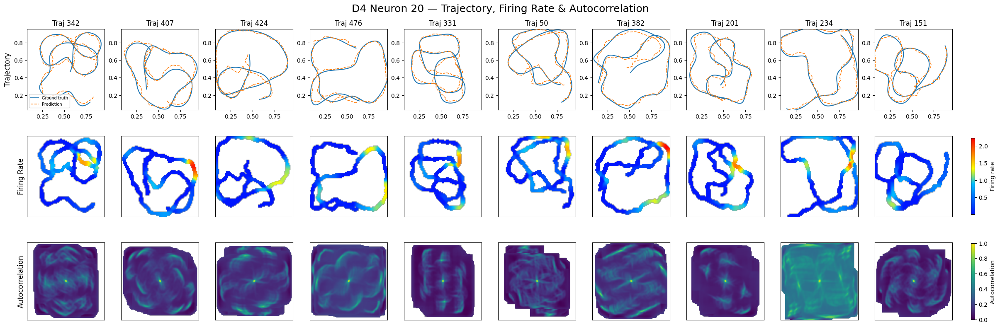

Displaying neuron 14


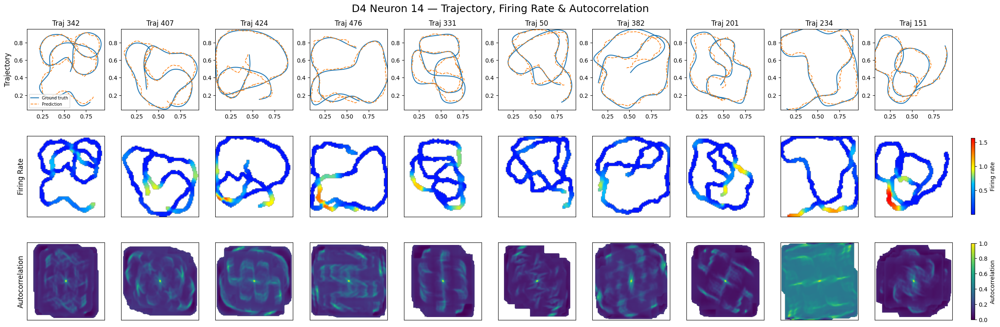

Displaying neuron 10


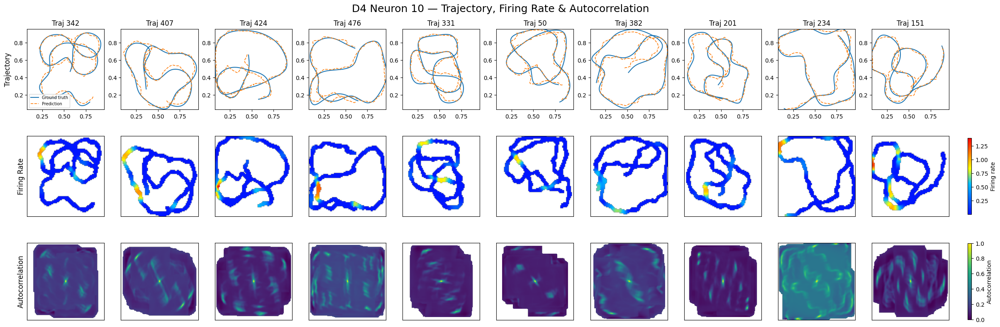

Displaying neuron 48


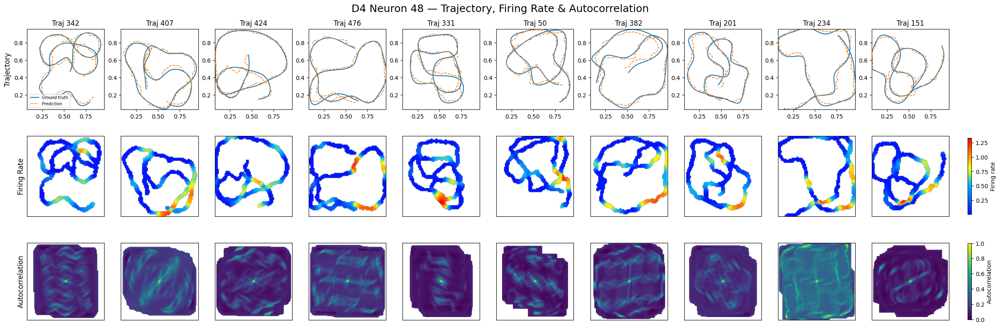

Displaying neuron 84


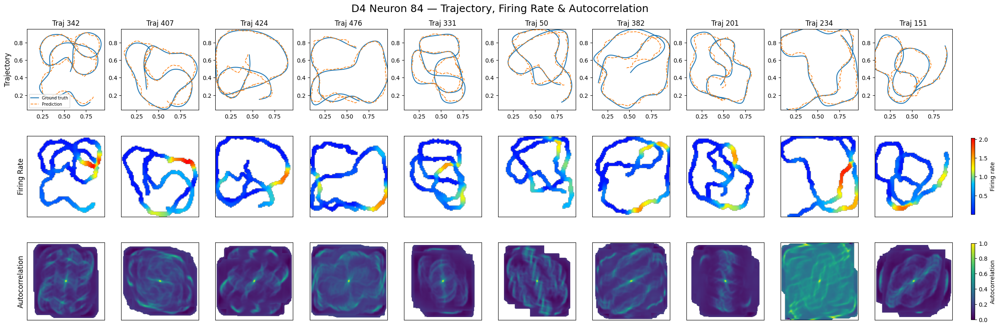

Displaying neuron 55


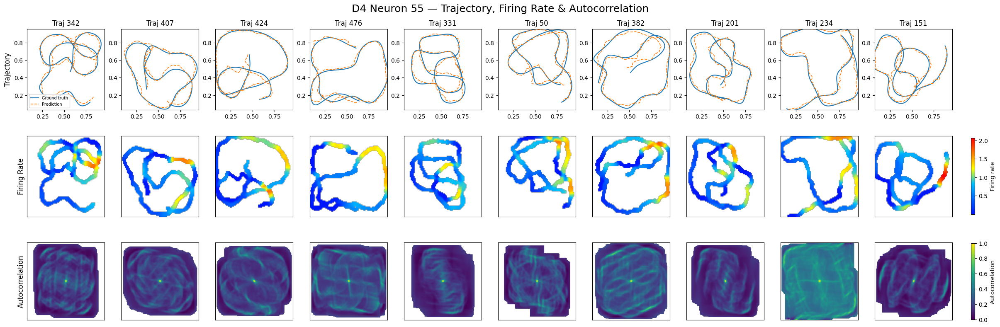

In [ ]:
# ============================================================
# D4 — CANDIDATE NEURON VISUALIZATION
#
# Rows:
#   1 = Ground truth + prediction
#   2 = Firing-rate map  (BLUE → RED)
#   3 = Autocorrelation
#
# Columns:
#   10 spatially diverse trajectories
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


# ------------------------------------------------------------
# Candidate neurons
# ------------------------------------------------------------

candidate_neurons = [20, 14, 10, 48, 84, 55]


# ------------------------------------------------------------
# Same 10 trajectories
# ------------------------------------------------------------

selected_trajectories = [
    342, 407, 424, 476, 331,
    50, 382, 201, 234, 151
]


# ------------------------------------------------------------
# Create BLUE → RED colormap for firing rate
#
# Low activity  = blue
# Medium        = lighter blue
# High activity = red
# ------------------------------------------------------------

blue_red_cmap = LinearSegmentedColormap.from_list(
    "blue_red_firing",
    [
        "#0015FF",   # low
        "#0066FF",
        "#00BFFF",
        "#FFFF00",   # medium/high
        "#FF8000",
        "#FF0000"    # highest
    ]
)


# ------------------------------------------------------------
# Bounds
# ------------------------------------------------------------

selected_positions = positions[
    selected_trajectories
]

xmin = np.nanmin(
    selected_positions[:, :, 0]
)

xmax = np.nanmax(
    selected_positions[:, :, 0]
)

ymin = np.nanmin(
    selected_positions[:, :, 1]
)

ymax = np.nanmax(
    selected_positions[:, :, 1]
)


# ============================================================
# LOOP THROUGH EACH CANDIDATE NEURON
# ============================================================

for neuron in candidate_neurons:

    print(
        f"Displaying neuron {neuron}"
    )

    # --------------------------------------------------------
    # Create figure
    # --------------------------------------------------------

    fig, axes = plt.subplots(
        3,
        len(selected_trajectories),
        figsize=(24, 8),
        constrained_layout=True
    )

    fig.suptitle(
        f"D4 Neuron {neuron} — "
        f"Trajectory, Firing Rate & Autocorrelation",
        fontsize=18
    )


    # ========================================================
    # FIRING RATE COLOR SCALE
    # ========================================================

    rate_maps = firing_rate_maps[
        neuron
    ]

    rate_vmin = np.nanmin(
        rate_maps
    )

    rate_vmax = np.nanmax(
        rate_maps
    )


    # ========================================================
    # AUTOCORRELATION COLOR SCALE
    # ========================================================

    autocorr_vmin = -0.6
    autocorr_vmax = 1.0


    # ========================================================
    # LOOP THROUGH TRAJECTORIES
    # ========================================================

    for col, trajectory in enumerate(
        selected_trajectories
    ):

        # ====================================================
        # ROW 1 — GROUND TRUTH + PREDICTION
        # ====================================================

        ax = axes[0, col]

        gt = ground_truth[
            trajectory
        ]

        pred = prediction[
            trajectory
        ]

        # Ground truth
        ax.plot(
            gt[:, 0],
            gt[:, 1],
            linewidth=1.5,
            label="Ground truth"
        )

        # Prediction
        ax.plot(
            pred[:, 0],
            pred[:, 1],
            linestyle="--",
            linewidth=1.2,
            label="Prediction"
        )

        ax.set_xlim(
            xmin,
            xmax
        )

        ax.set_ylim(
            ymin,
            ymax
        )

        ax.set_aspect(
            "equal"
        )

        ax.set_title(
            f"Traj {trajectory}"
        )

        if col == 0:

            ax.legend(
                fontsize=7,
                loc="best"
            )


        # ====================================================
        # ROW 2 — FIRING RATE
        # BLUE → RED
        # ====================================================

        ax = axes[1, col]

        rate_map = rate_maps[
            col
        ]

        im_rate = ax.imshow(
            rate_map.T,
            origin="lower",
            extent=[
                xmin,
                xmax,
                ymin,
                ymax
            ],
            aspect="equal",

            # BLUE → RED
            cmap=blue_red_cmap,

            vmin=rate_vmin,
            vmax=rate_vmax
        )

        ax.set_xticks([])
        ax.set_yticks([])


        

        # ============================================================
        # ROW 3 — NORMALIZED AUTOCORRELATION
        # 0 = minimum
        # 1 = maximum
        # ============================================================

        ax = axes[2, col]

        # Original autocorrelation map
        autocorr = autocorr_maps[
            neuron,
            col
        ].astype(float)

        # ------------------------------------------------------------
        # Normalize this map from 0 to 1
        # ------------------------------------------------------------

        ac_min = np.nanmin(autocorr)
        ac_max = np.nanmax(autocorr)

        if ac_max > ac_min:

            autocorr_norm = (
                autocorr - ac_min
            ) / (
                ac_max - ac_min
            )

        else:

            # If the map is completely flat
            autocorr_norm = np.zeros_like(
                autocorr
            )

        # ------------------------------------------------------------
        # Display
        # ------------------------------------------------------------

        im_auto = ax.imshow(
            autocorr_norm,
            origin="lower",
            cmap="viridis",
            vmin=0,
            vmax=1
        )

        ax.set_xticks([])
        ax.set_yticks([])


    # ========================================================
    # ROW LABELS
    # ========================================================

    axes[0, 0].set_ylabel(
        "Trajectory",
        fontsize=12
    )

    axes[1, 0].set_ylabel(
        "Firing Rate",
        fontsize=12
    )

    axes[2, 0].set_ylabel(
        "Autocorrelation",
        fontsize=12
    )


    # ========================================================
    # FIRING RATE COLORBAR
    # ========================================================

    cbar_rate = fig.colorbar(
        im_rate,
        ax=axes[1, :],
        shrink=0.75,
        pad=0.02
    )

    cbar_rate.set_label(
        "Firing rate"
    )


    # ========================================================
    # AUTOCORRELATION COLORBAR
    # ========================================================

    cbar_auto = fig.colorbar(
        im_auto,
        ax=axes[2, :],
        shrink=0.75,
        pad=0.02
    )

    cbar_auto.set_label(
        "Autocorrelation"
    )


    plt.show()

In [ ]:
def get_numeric_radius(radius_result):
    """
    Convert the output of first_ring_radius()
    into a single numeric radius.
    """

    # Already a scalar
    if np.isscalar(radius_result):
        return float(radius_result)

    # Tuple / list / numpy array
    if isinstance(radius_result, (tuple, list, np.ndarray)):

        if len(radius_result) == 0:
            return np.nan

        # First element is the radius
        value = radius_result[0]

        if np.isscalar(value):
            try:
                return float(value)
            except:
                return np.nan

    return np.nan

In [ ]:
# ============================================================
# D4 — CONCATENATE 10 TRAJECTORIES
# OCCUPANCY + FIRING RATE + AUTOCORRELATION + GRID SCORE
# ============================================================

import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter
from scipy.signal import correlate2d


# ============================================================
# SETTINGS
# ============================================================

layer_name = "d4"

selected_trajectories = [
    342, 407, 424, 476, 331,
    50, 382, 201, 234, 151
]

N_BINS = 80
SIGMA = 1.0
EPS = 1e-12

PEAK_THRESHOLD = 0.1
PEAK_NEIGHBOURHOOD = 5
MIN_RADIUS = 10


print("=" * 80)
print("D4 — CONCATENATED 10-TRAJECTORY ANALYSIS")
print("=" * 80)

print("\nSelected trajectories:")
print(selected_trajectories)


# ============================================================
# 1. CONCATENATE POSITIONS
# ============================================================

pos_concat = np.concatenate(
    [
        positions[t]
        for t in selected_trajectories
    ],
    axis=0
)


# ============================================================
# 2. CONCATENATE ACTIVATIONS
# ============================================================

act_concat = np.concatenate(
    [
        activations[t]
        for t in selected_trajectories
    ],
    axis=0
)


print("\nConcatenated shapes:")
print(
    "Positions    :",
    pos_concat.shape
)

print(
    "Activations  :",
    act_concat.shape
)


# Expected:
#
# positions   = (4500, 2)
# activations = (4500, 100)


# ============================================================
# 3. REMOVE INVALID POSITION SAMPLES
# ============================================================

valid_position = (
    np.isfinite(pos_concat[:, 0]) &
    np.isfinite(pos_concat[:, 1])
)

pos_concat = pos_concat[
    valid_position
]

act_concat = act_concat[
    valid_position
]

print(
    "\nValid position samples:",
    len(pos_concat)
)


# ============================================================
# 4. SPATIAL BOUNDS
# ============================================================

xmin = np.min(
    pos_concat[:, 0]
)

xmax = np.max(
    pos_concat[:, 0]
)

ymin = np.min(
    pos_concat[:, 1]
)

ymax = np.max(
    pos_concat[:, 1]
)

bounds = (
    xmin,
    xmax,
    ymin,
    ymax
)

print("\nBounds:")
print(bounds)


# ============================================================
# 5. BIN EDGES
# ============================================================

x_edges = np.linspace(
    xmin,
    xmax,
    N_BINS + 1
)

y_edges = np.linspace(
    ymin,
    ymax,
    N_BINS + 1
)


# ============================================================
# 6. OCCUPANCY MAP
# ============================================================

occupancy, _, _ = np.histogram2d(
    pos_concat[:, 0],
    pos_concat[:, 1],
    bins=[
        x_edges,
        y_edges
    ]
)


# Smooth occupancy
occupancy_smooth = gaussian_filter(
    occupancy.astype(float),
    sigma=SIGMA
)


print(
    "\nOccupancy map:",
    occupancy_smooth.shape
)


# ============================================================
# 7. AUTOCORRELATION FUNCTION
# ============================================================

def calculate_autocorrelation(rate_map):

    # --------------------------------------------------------
    # Replace NaNs with zero
    # --------------------------------------------------------

    rate = np.nan_to_num(
        rate_map,
        nan=0.0
    )

    # --------------------------------------------------------
    # Subtract mean
    # --------------------------------------------------------

    rate = (
        rate -
        np.mean(rate)
    )

    # --------------------------------------------------------
    # 2D autocorrelation
    # --------------------------------------------------------

    autocorr = correlate2d(
        rate,
        rate,
        mode="full",
        boundary="fill",
        fillvalue=0
    )

    # --------------------------------------------------------
    # Normalize by centre value
    # --------------------------------------------------------

    centre_y = (
        autocorr.shape[0] // 2
    )

    centre_x = (
        autocorr.shape[1] // 2
    )

    centre_value = autocorr[
        centre_y,
        centre_x
    ]

    if (
        np.isfinite(centre_value)
        and centre_value > 0
    ):

        autocorr = (
            autocorr /
            centre_value
        )

    else:

        autocorr[:] = np.nan

    return autocorr


# ============================================================
# 8. HELPER — SAFELY EXTRACT RADIUS
# ============================================================

def extract_radius(radius_result):

    """
    first_ring_radius() in the existing notebook may return
    a scalar OR a tuple/list/array.

    This function always converts it to one float.
    """

    # --------------------------------------------------------
    # Scalar
    # --------------------------------------------------------

    if np.isscalar(radius_result):

        try:
            return float(
                radius_result
            )

        except Exception:
            return np.nan


    # --------------------------------------------------------
    # Tuple / list / array
    # --------------------------------------------------------

    if isinstance(
        radius_result,
        (tuple, list, np.ndarray)
    ):

        if len(radius_result) == 0:
            return np.nan

        # First element is assumed to be radius
        value = radius_result[0]

        try:

            return float(
                value
            )

        except Exception:

            return np.nan


    return np.nan


# ============================================================
# 9. HELPER — SAFELY EXTRACT GRID SCORE
# ============================================================

def extract_grid_score(score_result):

    """
    Your compute_grid_score() returns:

        (
            grid_score,
            rotation_scores
        )

    This function extracts only the numerical grid score.
    """

    # --------------------------------------------------------
    # Scalar
    # --------------------------------------------------------

    if np.isscalar(score_result):

        try:

            return float(
                score_result
            )

        except Exception:

            return np.nan


    # --------------------------------------------------------
    # Tuple / list / array
    # --------------------------------------------------------

    if isinstance(
        score_result,
        (tuple, list, np.ndarray)
    ):

        if len(score_result) == 0:
            return np.nan

        try:

            return float(
                score_result[0]
            )

        except Exception:

            return np.nan


    return np.nan


# ============================================================
# 10. STORAGE
# ============================================================

results = []

concatenated_firing_maps = {}

concatenated_autocorr_maps = {}

concatenated_rotation_scores = {}

concatenated_radii = {}

concatenated_peaks = {}


# ============================================================
# 11. NUMBER OF NEURONS
# ============================================================

n_neurons = act_concat.shape[1]

print(
    "\nNumber of neurons:",
    n_neurons
)

print("\nStarting analysis...")
print("-" * 80)


# ============================================================
# 12. LOOP THROUGH ALL 100 NEURONS
# ============================================================

for neuron in range(n_neurons):

    # --------------------------------------------------------
    # ACTIVITY
    # --------------------------------------------------------

    activity = np.abs(
        act_concat[:, neuron]
    )


    # --------------------------------------------------------
    # Valid activity
    # --------------------------------------------------------

    valid_activity = (
        np.isfinite(activity)
    )

    x = pos_concat[
        valid_activity,
        0
    ]

    y = pos_concat[
        valid_activity,
        1
    ]

    a = activity[
        valid_activity
    ]


    # --------------------------------------------------------
    # ACTIVITY SUM
    # --------------------------------------------------------

    activity_sum, _, _ = np.histogram2d(
        x,
        y,
        bins=[
            x_edges,
            y_edges
        ],
        weights=a
    )


    # --------------------------------------------------------
    # FIRING RATE MAP
    # --------------------------------------------------------

    rate_map = (
        activity_sum /
        (
            occupancy +
            EPS
        )
    )


    # Unvisited bins
    rate_map[
        occupancy == 0
    ] = np.nan


    # --------------------------------------------------------
    # SMOOTH FIRING RATE MAP
    # --------------------------------------------------------

    valid_rate = np.isfinite(
        rate_map
    )

    rate_filled = np.nan_to_num(
        rate_map,
        nan=0.0
    )

    rate_smooth = gaussian_filter(
        rate_filled,
        sigma=SIGMA
    )


    # --------------------------------------------------------
    # Smooth validity mask
    # --------------------------------------------------------

    smooth_mask = gaussian_filter(
        valid_rate.astype(float),
        sigma=SIGMA
    )


    # --------------------------------------------------------
    # Correct for smoothing
    # --------------------------------------------------------

    rate_smooth = (
        rate_smooth /
        np.maximum(
            smooth_mask,
            EPS
        )
    )


    # --------------------------------------------------------
    # Remove poorly sampled areas
    # --------------------------------------------------------

    rate_smooth[
        smooth_mask < 0.05
    ] = np.nan


    # --------------------------------------------------------
    # SAVE FIRING RATE MAP
    # --------------------------------------------------------

    concatenated_firing_maps[
        neuron
    ] = rate_smooth


    # ========================================================
    # AUTOCORRELATION
    # ========================================================

    autocorr = calculate_autocorrelation(
        rate_smooth
    )


    # --------------------------------------------------------
    # SAVE AUTOCORRELATION
    # --------------------------------------------------------

    concatenated_autocorr_maps[
        neuron
    ] = autocorr


    # ========================================================
    # DETECT PEAKS
    # ========================================================

    try:

        peaks = detect_autocorr_peaks(
            autocorr,
            threshold=PEAK_THRESHOLD,
            neighbourhood=PEAK_NEIGHBOURHOOD
        )

    except Exception as e:

        peaks = np.empty(
            (0, 2),
            dtype=int
        )


    concatenated_peaks[
        neuron
    ] = peaks


    # ========================================================
    # IF NOT ENOUGH PEAKS
    # ========================================================

    if peaks is None or len(peaks) < 3:

        results.append({

            "Neuron": neuron,

            "Grid Score": np.nan,

            "Radius": np.nan,

            "Peaks": (
                0
                if peaks is None
                else len(peaks)
            )

        })

        continue


    # ========================================================
    # FIND CENTRE
    # ========================================================

    try:

        centre = centre_peak(
            peaks,
            autocorr.shape
        )

    except Exception:

        results.append({

            "Neuron": neuron,

            "Grid Score": np.nan,

            "Radius": np.nan,

            "Peaks": len(peaks)

        })

        continue


    # ========================================================
    # FIND FIRST RING RADIUS
    # ========================================================

    try:

        radius_result = first_ring_radius(
            peaks,
            centre,
            min_radius=MIN_RADIUS
        )

        radius = extract_radius(
            radius_result
        )

    except Exception:

        radius = np.nan


    concatenated_radii[
        neuron
    ] = radius


    # ========================================================
    # CHECK RADIUS
    # ========================================================

    if (
        not np.isfinite(radius)
        or radius <= 0
    ):

        results.append({

            "Neuron": neuron,

            "Grid Score": np.nan,

            "Radius": radius,

            "Peaks": len(peaks)

        })

        continue


    # ========================================================
    # ANNULUS
    # ========================================================

    inner_radius = (
        radius * 0.5
    )

    outer_radius = (
        radius * 1.5
    )


    # ========================================================
    # GRID SCORE
    # ========================================================

    try:

        score_result = compute_grid_score(
            autocorr,
            inner_radius,
            outer_radius
        )

        grid_score = extract_grid_score(
            score_result
        )


        # ----------------------------------------------------
        # Save rotation scores if available
        # ----------------------------------------------------

        if isinstance(
            score_result,
            (tuple, list)
        ) and len(score_result) > 1:

            concatenated_rotation_scores[
                neuron
            ] = score_result[1]

        else:

            concatenated_rotation_scores[
                neuron
            ] = None


    except Exception as e:

        grid_score = np.nan

        concatenated_rotation_scores[
            neuron
        ] = None


    # ========================================================
    # SAVE RESULT
    # ========================================================

    results.append({

        "Neuron": neuron,

        "Grid Score": grid_score,

        "Radius": radius,

        "Peaks": len(peaks)

    })


    # ========================================================
    # PROGRESS
    # ========================================================

    if (
        neuron % 10 == 0
        or neuron == n_neurons - 1
    ):

        print(
            f"Processed neuron "
            f"{neuron + 1}/{n_neurons}"
        )


# ============================================================
# 13. RESULTS DATAFRAME
# ============================================================

grid_results_concat = pd.DataFrame(
    results
)


# ============================================================
# SORT BY GRID SCORE
# ============================================================

grid_results_concat = (
    grid_results_concat
    .sort_values(
        "Grid Score",
        ascending=False,
        na_position="last"
    )
    .reset_index(
        drop=True
    )
)


# ============================================================
# 14. DISPLAY TOP 20
# ============================================================

print("\n")
print("=" * 80)
print(
    "TOP 20 D4 NEURONS — "
    "CONCATENATED 10 TRAJECTORIES"
)
print("=" * 80)

display(
    grid_results_concat.head(20)
)


# ============================================================
# 15. DISPLAY ALL NEURONS
# ============================================================

print("\n")
print("=" * 80)
print("ALL 100 D4 NEURONS")
print("=" * 80)

display(
    grid_results_concat
)


# ============================================================
# 16. SUMMARY
# ============================================================

valid_scores = (
    grid_results_concat[
        "Grid Score"
    ]
    .dropna()
)

print("\n")
print("=" * 80)
print("SUMMARY")
print("=" * 80)

print(
    f"Neurons analyzed : {n_neurons}"
)

print(
    f"Valid grid scores : "
    f"{len(valid_scores)}"
)

if len(valid_scores) > 0:

    print(
        f"Highest grid score : "
        f"{valid_scores.max():.4f}"
    )

    print(
        f"Mean grid score : "
        f"{valid_scores.mean():.4f}"
    )

    print(
        f"Median grid score : "
        f"{valid_scores.median():.4f}"
    )


print("\nAnalysis complete.")

D4 — CONCATENATED 10-TRAJECTORY ANALYSIS

Selected trajectories:
[342, 407, 424, 476, 331, 50, 382, 201, 234, 151]

Concatenated shapes:
Positions    : (4500, 2)
Activations  : (4500, 100)

Valid position samples: 4500

Bounds:
(np.float32(0.075534396), np.float32(0.96284366), np.float32(0.03220636), np.float32(0.95793784))

Occupancy map: (80, 80)

Number of neurons: 100

Starting analysis...
--------------------------------------------------------------------------------
Processed neuron 1/100
Processed neuron 11/100
Processed neuron 21/100
Processed neuron 31/100
Processed neuron 41/100
Processed neuron 51/100
Processed neuron 61/100
Processed neuron 71/100
Processed neuron 81/100
Processed neuron 100/100


TOP 20 D4 NEURONS — CONCATENATED 10 TRAJECTORIES


,Neuron,Grid Score,Radius,Peaks
0,56,0.372311,27.658633,9
1,20,0.116524,17.464249,21
2,83,0.106613,19.820118,9
3,0,0.077738,17.000000,9
4,23,-0.011931,18.514693,7
5,68,-0.025085,14.328634,7
6,71,-0.039015,19.451982,13
7,73,-0.091633,18.219544,13
8,41,-0.092591,21.023796,15
9,92,-0.105337,19.000000,19




ALL 100 D4 NEURONS


,Neuron,Grid Score,Radius,Peaks
0,56,0.372311,27.658633,9
1,20,0.116524,17.464249,21
2,83,0.106613,19.820118,9
3,0,0.077738,17.000000,9
4,23,-0.011931,18.514693,7
...,...,...,...,...
95,79,NaN,NaN,1
96,88,NaN,NaN,5
97,90,NaN,NaN,1
98,94,NaN,NaN,5




SUMMARY
Neurons analyzed : 100
Valid grid scores : 61
Highest grid score : 0.3723
Mean grid score : -0.2002
Median grid score : -0.2380

Analysis complete.


Ground truth: (4500, 2)
Prediction  : (4500, 2)


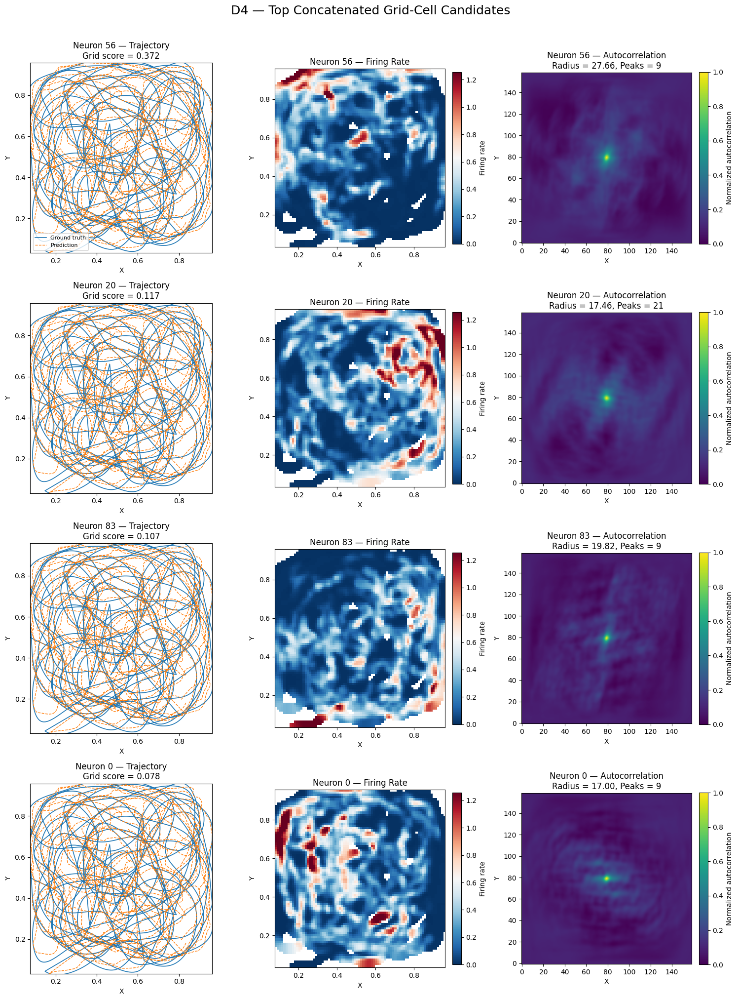

In [ ]:
# ============================================================
# D4 — VISUALIZE TOP CONCATENATED GRID-CELL CANDIDATES
# ============================================================

import matplotlib.pyplot as plt
import numpy as np


# ------------------------------------------------------------
# Top candidates from concatenated grid-score analysis
# ------------------------------------------------------------

top_neurons = [
    56,
    20,
    83,
    0
]


# ------------------------------------------------------------
# Concatenated trajectory
# ------------------------------------------------------------

# Ground truth
gt_concat = np.concatenate(
    [
        ground_truth[t]
        for t in selected_trajectories
    ],
    axis=0
)

# Prediction
pred_concat = np.concatenate(
    [
        prediction[t]
        for t in selected_trajectories
    ],
    axis=0
)


print("Ground truth:", gt_concat.shape)
print("Prediction  :", pred_concat.shape)


# ============================================================
# CREATE FIGURE
# ============================================================

fig, axes = plt.subplots(
    len(top_neurons),
    3,
    figsize=(15, 5 * len(top_neurons))
)


if len(top_neurons) == 1:
    axes = axes[np.newaxis, :]


# ============================================================
# GLOBAL FIRING RATE SCALE
# ============================================================

all_rates = []

for neuron in top_neurons:

    rate_map = concatenated_firing_maps[
        neuron
    ]

    valid = np.isfinite(
        rate_map
    )

    if np.any(valid):
        all_rates.extend(
            rate_map[valid].ravel()
        )


if len(all_rates) > 0:

    rate_vmin = 0

    rate_vmax = np.percentile(
        all_rates,
        99
    )

else:

    rate_vmin = 0
    rate_vmax = 1


# ============================================================
# GLOBAL AUTOCORRELATION SCALE
# ============================================================

auto_vmin = 0
auto_vmax = 1


# ============================================================
# PLOT EACH NEURON
# ============================================================

for row, neuron in enumerate(top_neurons):


    # ========================================================
    # GRID SCORE
    # ========================================================

    neuron_row = grid_results_concat[
        grid_results_concat["Neuron"] == neuron
    ]

    score = neuron_row[
        "Grid Score"
    ].iloc[0]

    radius = neuron_row[
        "Radius"
    ].iloc[0]

    peaks = neuron_row[
        "Peaks"
    ].iloc[0]


    # ========================================================
    # COLUMN 1 — CONCATENATED TRAJECTORY
    # ========================================================

    ax = axes[row, 0]

    ax.plot(
        gt_concat[:, 0],
        gt_concat[:, 1],
        linewidth=1.2,
        label="Ground truth"
    )

    ax.plot(
        pred_concat[:, 0],
        pred_concat[:, 1],
        linestyle="--",
        linewidth=1.0,
        label="Prediction"
    )

    ax.set_xlim(
        xmin,
        xmax
    )

    ax.set_ylim(
        ymin,
        ymax
    )

    ax.set_aspect(
        "equal"
    )

    ax.set_title(
        f"Neuron {neuron} — Trajectory\n"
        f"Grid score = {score:.3f}"
    )

    ax.set_xlabel("X")
    ax.set_ylabel("Y")

    if row == 0:
        ax.legend(
            fontsize=8
        )


    # ========================================================
    # COLUMN 2 — FIRING RATE MAP
    # ========================================================

    ax = axes[row, 1]

    rate_map = concatenated_firing_maps[
        neuron
    ]

    im_rate = ax.imshow(
        rate_map.T,
        origin="lower",
        extent=[
            xmin,
            xmax,
            ymin,
            ymax
        ],
        cmap="RdBu_r",
        vmin=rate_vmin,
        vmax=rate_vmax,
        aspect="equal"
    )

    ax.set_title(
        f"Neuron {neuron} — Firing Rate"
    )

    ax.set_xlabel("X")
    ax.set_ylabel("Y")

    plt.colorbar(
        im_rate,
        ax=ax,
        fraction=0.046,
        pad=0.04,
        label="Firing rate"
    )


    # ========================================================
    # COLUMN 3 — AUTOCORRELATION
    # ========================================================

    ax = axes[row, 2]

    autocorr = concatenated_autocorr_maps[
        neuron
    ].astype(float)

    # --------------------------------------------------------
    # Normalize ONLY FOR DISPLAY
    # --------------------------------------------------------

    ac_min = np.nanmin(
        autocorr
    )

    ac_max = np.nanmax(
        autocorr
    )

    if ac_max > ac_min:

        autocorr_display = (
            autocorr - ac_min
        ) / (
            ac_max - ac_min
        )

    else:

        autocorr_display = np.zeros_like(
            autocorr
        )


    im_auto = ax.imshow(
        autocorr_display,
        origin="lower",
        cmap="viridis",
        vmin=0,
        vmax=1
    )

    ax.set_title(
        f"Neuron {neuron} — Autocorrelation\n"
        f"Radius = {radius:.2f}, Peaks = {peaks}"
    )

    ax.set_xlabel("X")
    ax.set_ylabel("Y")

    plt.colorbar(
        im_auto,
        ax=ax,
        fraction=0.046,
        pad=0.04,
        label="Normalized autocorrelation"
    )


# ============================================================
# FINAL LAYOUT
# ============================================================

fig.suptitle(
    "D4 — Top Concatenated Grid-Cell Candidates",
    fontsize=18,
    y=1.01
)

plt.tight_layout()

plt.show()

this does not look promising- i am going to try out new pipeline 



In [ ]:
# ============================================================
# D4 GRID-CELL ANALYSIS
# 10 spatially diverse trajectories
#
# For every neuron:
#   1. Pool spatial samples across 10 trajectories
#   2. Compute occupancy map
#   3. Compute pooled firing-rate map
#   4. Compute autocorrelation
#   5. Calculate gridness from 6-fold rotational symmetry
#   6. Split trajectories into A/B groups
#   7. Calculate split-half spatial reliability
#
# This does NOT concatenate trajectories temporally.
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.ndimage import gaussian_filter, rotate
from scipy.signal import correlate2d


# ============================================================
# SETTINGS
# ============================================================

layer_name = "d4"

selected_trajectories = [
    342, 407, 424, 476, 331,
    50, 382, 201, 234, 151
]

N_BINS = 40

# Spatial smoothing of firing-rate maps
FIRING_SIGMA = 1.0

# Autocorrelation smoothing
AUTOCORR_SIGMA = 1.0

EPS = 1e-10


# ============================================================
# CHECK INPUTS
# ============================================================

print("=" * 70)
print("D4 POOLED GRID-CELL ANALYSIS")
print("=" * 70)

print("Positions:", positions.shape)
print("Activations:", activations.shape)
print("Selected trajectories:", selected_trajectories)

assert activations.shape[0] > max(selected_trajectories)
assert positions.shape[0] > max(selected_trajectories)

n_neurons = activations.shape[2]

print("Number of neurons:", n_neurons)


# ============================================================
# EXTRACT SELECTED TRAJECTORIES
# ============================================================

pos_selected = positions[selected_trajectories]

# Convert complex activations to magnitude
# If already real, this does nothing harmful.
act_selected = np.abs(
    activations[selected_trajectories]
)

print("Selected positions:", pos_selected.shape)
print("Selected activations:", act_selected.shape)


# ============================================================
# GLOBAL SPATIAL BOUNDS
# ============================================================

x_all = pos_selected[:, :, 0].ravel()
y_all = pos_selected[:, :, 1].ravel()

valid_xy = (
    np.isfinite(x_all) &
    np.isfinite(y_all)
)

x_min = np.nanmin(x_all[valid_xy])
x_max = np.nanmax(x_all[valid_xy])

y_min = np.nanmin(y_all[valid_xy])
y_max = np.nanmax(y_all[valid_xy])

bounds = (
    x_min,
    x_max,
    y_min,
    y_max
)

print("Bounds:", bounds)


# ============================================================
# FUNCTION 1:
# OCCUPANCY MAP
# ============================================================

def compute_occupancy(
    pos,
    bounds,
    n_bins=40
):

    x = pos[:, 0]
    y = pos[:, 1]

    valid = (
        np.isfinite(x) &
        np.isfinite(y)
    )

    occupancy, x_edges, y_edges = np.histogram2d(
        x[valid],
        y[valid],
        bins=n_bins,
        range=[
            [bounds[0], bounds[1]],
            [bounds[2], bounds[3]]
        ]
    )

    return occupancy, x_edges, y_edges


# ============================================================
# FUNCTION 2:
# FIRING RATE MAP
# ============================================================

def compute_firing_rate_map(
    pos,
    activity,
    bounds,
    n_bins=40,
    sigma=1.0
):

    x = pos[:, 0]
    y = pos[:, 1]

    activity = np.asarray(activity)

    valid = (
        np.isfinite(x) &
        np.isfinite(y) &
        np.isfinite(activity)
    )

    x = x[valid]
    y = y[valid]
    activity = activity[valid]

    # Occupancy
    occupancy, x_edges, y_edges = np.histogram2d(
        x,
        y,
        bins=n_bins,
        range=[
            [bounds[0], bounds[1]],
            [bounds[2], bounds[3]]
        ]
    )

    # Total activity
    activity_sum, _, _ = np.histogram2d(
        x,
        y,
        bins=n_bins,
        range=[
            [bounds[0], bounds[1]],
            [bounds[2], bounds[3]]
        ],
        weights=activity
    )

    # Firing/activity rate
    rate_map = np.divide(
        activity_sum,
        occupancy,
        out=np.zeros_like(activity_sum, dtype=float),
        where=occupancy > 0
    )

    # Mask unvisited bins
    rate_map[occupancy == 0] = np.nan

    # Smooth while respecting occupancy mask
    valid_mask = np.isfinite(rate_map)

    filled = np.nan_to_num(
        rate_map,
        nan=0.0
    )

    smoothed_activity = gaussian_filter(
        filled,
        sigma=sigma
    )

    smoothed_occupancy = gaussian_filter(
        valid_mask.astype(float),
        sigma=sigma
    )

    rate_map = np.divide(
        smoothed_activity,
        smoothed_occupancy,
        out=np.zeros_like(smoothed_activity),
        where=smoothed_occupancy > EPS
    )

    rate_map[smoothed_occupancy < 0.1] = np.nan

    return rate_map, occupancy


# ============================================================
# FUNCTION 3:
# AUTOCORRELATION
# ============================================================

def compute_autocorrelation(rate_map):

    valid = np.isfinite(rate_map)

    if np.sum(valid) < 10:
        return np.full(
            (2 * rate_map.shape[0] - 1,
             2 * rate_map.shape[1] - 1),
            np.nan
        )

    # Replace NaNs with mean
    mean_rate = np.nanmean(rate_map)

    data = np.where(
        valid,
        rate_map,
        mean_rate
    )

    # Remove mean
    data = data - np.mean(data)

    # 2D autocorrelation
    autocorr = correlate2d(
        data,
        data,
        mode="full",
        boundary="fill",
        fillvalue=0
    )

    # Normalize
    centre_y = autocorr.shape[0] // 2
    centre_x = autocorr.shape[1] // 2

    centre_value = autocorr[
        centre_y,
        centre_x
    ]

    if centre_value > EPS:
        autocorr = autocorr / centre_value

    # Smooth
    autocorr = gaussian_filter(
        autocorr,
        sigma=AUTOCORR_SIGMA
    )

    # Normalize again
    centre_value = autocorr[
        centre_y,
        centre_x
    ]

    if centre_value > EPS:
        autocorr = autocorr / centre_value

    return autocorr


# ============================================================
# FUNCTION 4:
# GRIDNESS
#
# Calculates:
#
#   (correlation at 60 + correlation at 120) / 2
#   -
#   (correlation at 30 + 90 + 150) / 3
#
# using an annulus around the central autocorrelation peak.
# ============================================================

def calculate_gridness(
    autocorr,
    inner_radius=None,
    outer_radius=None
):

    h, w = autocorr.shape

    cy = h // 2
    cx = w // 2

    yy, xx = np.indices(
        autocorr.shape
    )

    distance = np.sqrt(
        (xx - cx) ** 2 +
        (yy - cy) ** 2
    )

    max_radius = min(
        cx,
        cy
    )

    if inner_radius is None:
        inner_radius = max_radius * 0.20

    if outer_radius is None:
        outer_radius = max_radius * 0.65

    annulus = (
        (distance >= inner_radius) &
        (distance <= outer_radius) &
        np.isfinite(autocorr)
    )

    if np.sum(annulus) < 20:
        return np.nan, {}

    original = autocorr.copy()

    values = original[annulus]

    if np.std(values) < EPS:
        return np.nan, {}

    correlations = {}

    angles = [
        30,
        60,
        90,
        120,
        150
    ]

    for angle in angles:

        rotated = rotate(
            original,
            angle=angle,
            reshape=False,
            order=1,
            mode="nearest"
        )

        a = original[annulus]
        b = rotated[annulus]

        valid = (
            np.isfinite(a) &
            np.isfinite(b)
        )

        if np.sum(valid) < 20:
            correlations[angle] = np.nan
            continue

        a = a[valid]
        b = b[valid]

        if (
            np.std(a) < EPS or
            np.std(b) < EPS
        ):
            correlations[angle] = np.nan
            continue

        correlations[angle] = np.corrcoef(
            a,
            b
        )[0, 1]

    r30 = correlations.get(30, np.nan)
    r60 = correlations.get(60, np.nan)
    r90 = correlations.get(90, np.nan)
    r120 = correlations.get(120, np.nan)
    r150 = correlations.get(150, np.nan)

    positive = np.nanmean([
        r60,
        r120
    ])

    negative = np.nanmean([
        r30,
        r90,
        r150
    ])

    gridness = positive - negative

    return gridness, correlations


# ============================================================
# FUNCTION 5:
# SPLIT-HALF RELIABILITY
# ============================================================

def spatial_map_correlation(
    map_a,
    map_b
):

    valid = (
        np.isfinite(map_a) &
        np.isfinite(map_b)
    )

    if np.sum(valid) < 20:
        return np.nan

    a = map_a[valid]
    b = map_b[valid]

    if (
        np.std(a) < EPS or
        np.std(b) < EPS
    ):
        return np.nan

    return np.corrcoef(
        a,
        b
    )[0, 1]


# ============================================================
# SPLIT THE 10 TRAJECTORIES
# ============================================================

group_A = selected_trajectories[::2]
group_B = selected_trajectories[1::2]

print()
print("Split-half groups:")
print("Group A:", group_A)
print("Group B:", group_B)


# ============================================================
# STORAGE
# ============================================================

results = []

pooled_rate_maps = {}
autocorr_maps = {}

split_A_maps = {}
split_B_maps = {}


# ============================================================
# ANALYZE ALL 100 NEURONS
# ============================================================

for neuron in range(n_neurons):

    # --------------------------------------------------------
    # POOL SPATIAL SAMPLES
    # --------------------------------------------------------

    pooled_pos = pos_selected.reshape(
        -1,
        2
    )

    pooled_activity = act_selected[
        :, :, neuron
    ].reshape(-1)

    # --------------------------------------------------------
    # POOLED FIRING RATE MAP
    # --------------------------------------------------------

    pooled_rate, pooled_occupancy = compute_firing_rate_map(
        pooled_pos,
        pooled_activity,
        bounds,
        n_bins=N_BINS,
        sigma=FIRING_SIGMA
    )

    # --------------------------------------------------------
    # AUTOCORRELATION
    # --------------------------------------------------------

    autocorr = compute_autocorrelation(
        pooled_rate
    )

    # --------------------------------------------------------
    # GRIDNESS
    # --------------------------------------------------------

    gridness, correlations = calculate_gridness(
        autocorr
    )

    # --------------------------------------------------------
    # GROUP A
    # --------------------------------------------------------

    pos_A = positions[group_A].reshape(
        -1,
        2
    )

    act_A = np.abs(
        activations[group_A, :, neuron]
    ).reshape(-1)

    rate_A, _ = compute_firing_rate_map(
        pos_A,
        act_A,
        bounds,
        n_bins=N_BINS,
        sigma=FIRING_SIGMA
    )

    # --------------------------------------------------------
    # GROUP B
    # --------------------------------------------------------

    pos_B = positions[group_B].reshape(
        -1,
        2
    )

    act_B = np.abs(
        activations[group_B, :, neuron]
    ).reshape(-1)

    rate_B, _ = compute_firing_rate_map(
        pos_B,
        act_B,
        bounds,
        n_bins=N_BINS,
        sigma=FIRING_SIGMA
    )

    # --------------------------------------------------------
    # SPLIT-HALF RELIABILITY
    # --------------------------------------------------------

    split_corr = spatial_map_correlation(
        rate_A,
        rate_B
    )

    # --------------------------------------------------------
    # SAVE
    # --------------------------------------------------------

    pooled_rate_maps[neuron] = pooled_rate
    autocorr_maps[neuron] = autocorr

    split_A_maps[neuron] = rate_A
    split_B_maps[neuron] = rate_B

    results.append({
        "Neuron": neuron,
        "Grid Score": gridness,
        "Split-half Correlation": split_corr,
        "R30": correlations.get(30, np.nan),
        "R60": correlations.get(60, np.nan),
        "R90": correlations.get(90, np.nan),
        "R120": correlations.get(120, np.nan),
        "R150": correlations.get(150, np.nan),
    })


# ============================================================
# RESULTS TABLE
# ============================================================

results_df = pd.DataFrame(results)

results_df = results_df.sort_values(
    by="Grid Score",
    ascending=False
).reset_index(drop=True)


# ============================================================
# DISPLAY TOP 20
# ============================================================

print()
print("=" * 70)
print("TOP 20 D4 NEURONS — POOLED GRIDNESS")
print("=" * 70)

display(
    results_df.head(20)
)


# ============================================================
# ALSO RANK BY COMBINED GRIDNESS + RELIABILITY
# ============================================================

# We want neurons that have:
#   high gridness
#   AND high split-half reliability
#
# Normalize both to 0-1 first.

grid_min = results_df["Grid Score"].min()
grid_max = results_df["Grid Score"].max()

rel_min = results_df[
    "Split-half Correlation"
].min()

rel_max = results_df[
    "Split-half Correlation"
].max()

results_df["Gridness_Normalized"] = (
    (results_df["Grid Score"] - grid_min) /
    (grid_max - grid_min + EPS)
)

results_df["Reliability_Normalized"] = (
    (
        results_df["Split-half Correlation"]
        - rel_min
    ) /
    (
        rel_max - rel_min + EPS
    )
)

results_df["Combined Score"] = (
    0.5 * results_df["Gridness_Normalized"] +
    0.5 * results_df["Reliability_Normalized"]
)

combined_df = results_df.sort_values(
    "Combined Score",
    ascending=False
).reset_index(drop=True)


print()
print("=" * 70)
print("TOP 20 D4 NEURONS — GRIDNESS + SPLIT-HALF RELIABILITY")
print("=" * 70)

display(
    combined_df[
        [
            "Neuron",
            "Grid Score",
            "Split-half Correlation",
            "Combined Score",
            "R30",
            "R60",
            "R90",
            "R120",
            "R150"
        ]
    ].head(20)
)


print()
print("Analysis complete.")

D4 POOLED GRID-CELL ANALYSIS
Positions: (500, 450, 2)
Activations: (500, 450, 100)
Selected trajectories: [342, 407, 424, 476, 331, 50, 382, 201, 234, 151]
Number of neurons: 100
Selected positions: (10, 450, 2)
Selected activations: (10, 450, 100)
Bounds: (np.float32(0.075534396), np.float32(0.96284366), np.float32(0.03220636), np.float32(0.95793784))

Split-half groups:
Group A: [342, 424, 331, 382, 234]
Group B: [407, 476, 50, 201, 151]

TOP 20 D4 NEURONS — POOLED GRIDNESS


,Neuron,Grid Score,Split-half Correlation,R30,R60,R90,R120,R150
0,52,0.257378,0.229660,-0.170758,-0.006425,-0.445475,-0.003624,-0.170976
1,56,0.034181,0.309029,0.467944,0.354646,0.033016,0.361800,0.471167
2,68,-0.031686,0.127931,0.513203,0.302419,-0.016537,0.311113,0.518688
3,4,-0.058370,0.306374,0.672039,0.607819,0.661339,0.613530,0.673755
4,44,-0.069035,0.113817,-0.029131,-0.156126,-0.204129,-0.153927,-0.024713
5,7,-0.115224,0.489100,0.587182,0.377702,0.308769,0.379603,0.585680
6,83,-0.120620,0.236803,0.030680,-0.000517,0.308975,0.005707,0.029991
7,76,-0.131489,-0.013809,-0.041383,-0.141018,0.066408,-0.132795,-0.041279
8,27,-0.145059,0.456519,0.797382,0.553809,0.496878,0.548131,0.793825
9,41,-0.154842,0.402804,0.732722,0.491343,0.480326,0.497528,0.734785



TOP 20 D4 NEURONS — GRIDNESS + SPLIT-HALF RELIABILITY


,Neuron,Grid Score,Split-half Correlation,Combined Score,R30,R60,R90,R120,R150
0,52,0.257378,0.229660,0.651747,-0.170758,-0.006425,-0.445475,-0.003624,-0.170976
1,38,-0.161333,0.670592,0.583006,0.799253,0.468506,0.296332,0.473664,0.801668
2,6,-0.244940,0.742920,0.559485,0.716517,0.220944,-0.028235,0.228218,0.720281
3,79,-0.285367,0.788410,0.554666,0.437653,-0.064883,-0.214501,-0.065586,0.437246
4,97,-0.255568,0.707282,0.528553,0.714963,0.214945,-0.019577,0.213506,0.713995
5,12,-0.209233,0.630460,0.518690,0.622592,0.204632,-0.001824,0.205105,0.621537
6,56,0.034181,0.309029,0.518077,0.467944,0.354646,0.033016,0.361800,0.471167
7,61,-0.174256,0.571020,0.510343,0.793201,0.448813,0.276218,0.442496,0.790312
8,3,-0.182802,0.579675,0.508725,0.763683,0.399422,0.223910,0.404819,0.767175
9,7,-0.115224,0.489100,0.507720,0.587182,0.377702,0.308769,0.379603,0.585680



Analysis complete.


D4 POOLED GRIDNESS — ALL 100 NEURONS + SHUFFLES
Positions: (500, 450, 2)
Activations: (500, 450, 100)
Selected trajectories: [342, 407, 424, 476, 331, 50, 382, 201, 234, 151]
Number of trajectories: 10
Number of neurons: 100
Number of shuffles: 100

Selected positions: (10, 450, 2)
Selected activations: (10, 450, 100)

Bounds:
x: 0.075534396 to 0.96284366
y: 0.03220636 to 0.95793784

CALCULATING REAL GRID SCORES
Completed 10/100
Completed 20/100
Completed 30/100
Completed 40/100
Completed 50/100
Completed 60/100
Completed 70/100
Completed 80/100
Completed 90/100
Completed 100/100

STARTING CIRCULAR SHUFFLES

Neuron 1/100
  Real score = -0.1574 | Shuffle mean = -0.1504

Neuron 2/100
  Real score = -0.2707 | Shuffle mean = -0.1538

Neuron 3/100
  Real score = -0.2448 | Shuffle mean = -0.1645

Neuron 4/100
  Real score = -0.1665 | Shuffle mean = -0.1752

Neuron 5/100
  Real score = -0.0237 | Shuffle mean = -0.1883

Neuron 6/100
  Real score = -0.0959 | Shuffle mean = -0.1540

Neuron 7/100

,Neuron,Real Grid Score,Shuffle Mean,Shuffle Std,Shuffle 95%,Shuffle 99%,Z Score,P Value,Percentile,Significant_p05,Significant_p01,Positive_Grid
0,52,0.0639,-0.1626,0.1644,0.0941,0.2647,1.3778,0.0891,92.0,False,False,True
1,4,-0.0237,-0.1883,0.1820,0.1393,0.4983,0.9045,0.1188,89.0,False,False,False
2,37,-0.0590,-0.1875,0.1508,0.1678,0.2597,0.8524,0.1386,87.0,False,False,False
3,27,-0.0492,-0.1896,0.1538,0.0961,0.2937,0.9126,0.1485,86.0,False,False,False
4,20,-0.0043,-0.1582,0.1742,0.1591,0.3638,0.8835,0.1683,84.0,False,False,False
5,56,-0.0391,-0.1695,0.1635,0.0879,0.5095,0.7977,0.1683,84.0,False,False,False
6,76,0.0341,-0.1119,0.2450,0.3915,0.6506,0.5957,0.2178,79.0,False,False,True
7,68,-0.0077,-0.1338,0.1992,0.1994,0.4930,0.6329,0.2178,79.0,False,False,False
8,23,-0.0544,-0.1680,0.1626,0.0614,0.2089,0.6986,0.2178,79.0,False,False,False
9,61,-0.0823,-0.1533,0.1839,0.1677,0.2443,0.3858,0.2772,73.0,False,False,False



SUMMARY
Positive grid scores: 2/100
Shuffle significant p < 0.05: 0/100
Shuffle significant p < 0.01: 0/100


POSITIVE + SHUFFLE-SIGNIFICANT GRID-CELL CANDIDATES
No neurons passed both criteria.


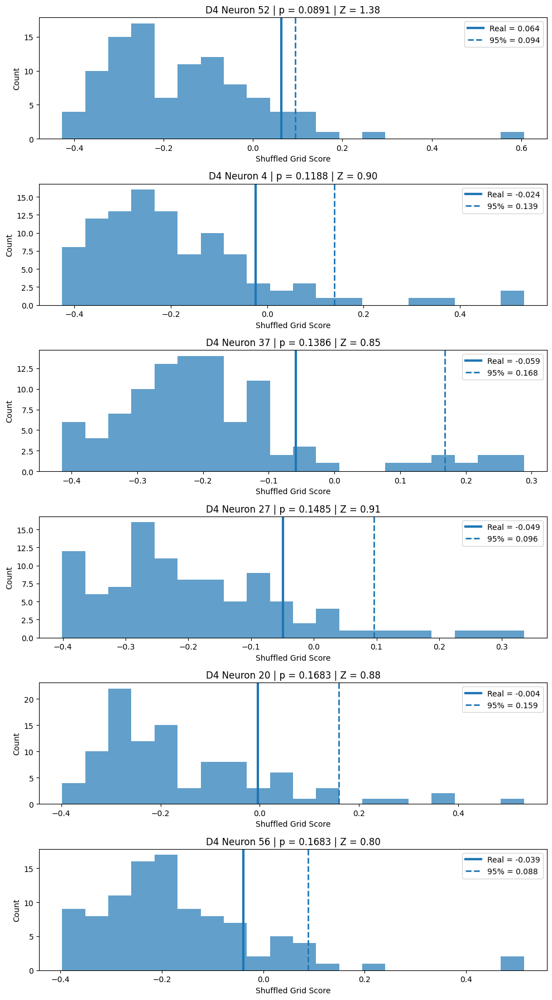


Results stored in:
d4_grid_shuffle_results


In [ ]:
# ================================================================
# D4 — ALL 100 NEURON GRIDNESS SHUFFLE TEST
# Pooled 10 spatially diverse trajectories
#
# Each shuffle circularly shifts activity independently within
# each trajectory, preserving temporal structure but breaking
# the relationship between activity and spatial position.
# ================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.ndimage import gaussian_filter
from scipy.signal import correlate2d
from scipy.ndimage import rotate
from scipy.stats import norm


# ================================================================
# PARAMETERS
# ================================================================

N_SHUFFLES = 100       # Start with 100; increase later for candidates
N_BINS = 40             # spatial firing-rate map resolution
SIGMA = 1.0             # smoothing of firing-rate map
EPS = 1e-12

# Gridness annulus
INNER_RADIUS_FRAC = 0.15
OUTER_RADIUS_FRAC = 0.45

# Rotations used for gridness
ANGLES = [30, 60, 90, 120, 150]

RNG = np.random.default_rng(42)


# ================================================================
# CHECK INPUTS
# ================================================================

print("=" * 70)
print("D4 POOLED GRIDNESS — ALL 100 NEURONS + SHUFFLES")
print("=" * 70)

print("Positions:", positions.shape)
print("Activations:", activations.shape)
print("Selected trajectories:", selected_trajectories)

n_trajectories = len(selected_trajectories)
n_neurons = activations.shape[2]

print("Number of trajectories:", n_trajectories)
print("Number of neurons:", n_neurons)
print("Number of shuffles:", N_SHUFFLES)


# ================================================================
# EXTRACT SELECTED TRAJECTORIES
# ================================================================

selected_positions = positions[selected_trajectories]
selected_activations = activations[selected_trajectories]

print("\nSelected positions:", selected_positions.shape)
print("Selected activations:", selected_activations.shape)


# ================================================================
# GLOBAL SPATIAL BOUNDS
# ================================================================

x_all = selected_positions[:, :, 0].ravel()
y_all = selected_positions[:, :, 1].ravel()

valid_xy = np.isfinite(x_all) & np.isfinite(y_all)

xmin = np.nanmin(x_all[valid_xy])
xmax = np.nanmax(x_all[valid_xy])
ymin = np.nanmin(y_all[valid_xy])
ymax = np.nanmax(y_all[valid_xy])

print("\nBounds:")
print("x:", xmin, "to", xmax)
print("y:", ymin, "to", ymax)


# ================================================================
# HELPER: FIRING RATE MAP
# ================================================================

def make_firing_rate_map(pos, activity,
                         xmin, xmax, ymin, ymax,
                         n_bins=40, sigma=1.0):

    x = pos[:, 0]
    y = pos[:, 1]
    a = activity

    valid = (
        np.isfinite(x) &
        np.isfinite(y) &
        np.isfinite(a)
    )

    x = x[valid]
    y = y[valid]
    a = a[valid]

    if len(x) < 10:
        return np.full((n_bins, n_bins), np.nan)

    # Occupancy
    occupancy, _, _ = np.histogram2d(
        y,
        x,
        bins=n_bins,
        range=[
            [ymin, ymax],
            [xmin, xmax]
        ]
    )

    # Activity
    activity_sum, _, _ = np.histogram2d(
        y,
        x,
        bins=n_bins,
        range=[
            [ymin, ymax],
            [xmin, xmax]
        ],
        weights=a
    )

    # Smooth both
    occupancy_smooth = gaussian_filter(
        occupancy.astype(float),
        sigma=sigma
    )

    activity_smooth = gaussian_filter(
        activity_sum.astype(float),
        sigma=sigma
    )

    # Firing rate
    rate_map = activity_smooth / (
        occupancy_smooth + EPS
    )

    # Remove bins with essentially no occupancy
    rate_map[occupancy_smooth < 0.05] = np.nan

    return rate_map


# ================================================================
# HELPER: AUTOCORRELATION
# ================================================================

def compute_autocorrelation(rate_map):

    if np.all(~np.isfinite(rate_map)):
        return np.full(
            (2 * rate_map.shape[0] - 1,
             2 * rate_map.shape[1] - 1),
            np.nan
        )

    # Replace NaNs with zero
    data = np.nan_to_num(
        rate_map,
        nan=0.0
    )

    # Remove mean
    data = data - np.mean(data)

    # Autocorrelation
    autocorr = correlate2d(
        data,
        data,
        mode="full",
        boundary="fill",
        fillvalue=0
    )

    # Normalize
    center = (
        autocorr.shape[0] // 2,
        autocorr.shape[1] // 2
    )

    center_value = autocorr[center]

    if abs(center_value) > EPS:
        autocorr = autocorr / center_value

    # Normalize to 0–1 for visualization only
    return autocorr


# ================================================================
# HELPER: GRIDNESS
#
# Uses rotational correlations in a circular annulus.
#
# Gridness = mean(60°,120°)
#            -
#            mean(30°,90°,150°)
# ================================================================

def compute_gridness(autocorr):

    if np.all(~np.isfinite(autocorr)):
        return np.nan, {}

    data = np.nan_to_num(
        autocorr,
        nan=0.0
    )

    h, w = data.shape

    cy = (h - 1) / 2
    cx = (w - 1) / 2

    yy, xx = np.indices(data.shape)

    radius = np.sqrt(
        (xx - cx) ** 2 +
        (yy - cy) ** 2
    )

    max_radius = min(h, w) / 2

    inner_radius = (
        INNER_RADIUS_FRAC * max_radius
    )

    outer_radius = (
        OUTER_RADIUS_FRAC * max_radius
    )

    annulus = (
        (radius >= inner_radius) &
        (radius <= outer_radius)
    )

    base = data[annulus]

    if len(base) < 20:
        return np.nan, {}

    correlations = {}

    for angle in ANGLES:

        rotated = rotate(
            data,
            angle=angle,
            reshape=False,
            order=1,
            mode="constant",
            cval=0.0
        )

        r = rotated[annulus]

        valid = (
            np.isfinite(base) &
            np.isfinite(r)
        )

        if np.sum(valid) < 20:
            correlations[angle] = np.nan
            continue

        x1 = base[valid]
        x2 = r[valid]

        if (
            np.std(x1) < EPS or
            np.std(x2) < EPS
        ):
            correlations[angle] = np.nan
        else:
            correlations[angle] = np.corrcoef(
                x1,
                x2
            )[0, 1]

    positive_angles = [60, 120]
    negative_angles = [30, 90, 150]

    positive = [
        correlations[a]
        for a in positive_angles
        if np.isfinite(correlations[a])
    ]

    negative = [
        correlations[a]
        for a in negative_angles
        if np.isfinite(correlations[a])
    ]

    if len(positive) == 0 or len(negative) == 0:
        return np.nan, correlations

    grid_score = (
        np.mean(positive)
        -
        np.mean(negative)
    )

    return grid_score, correlations


# ================================================================
# HELPER: CALCULATE POOLED MAP
# ================================================================

def calculate_pooled_grid_score(
    positions_10,
    activations_10,
    neuron,
    xmin,
    xmax,
    ymin,
    ymax
):

    all_positions = []
    all_activity = []

    for traj_i in range(len(positions_10)):

        pos = positions_10[traj_i]
        act = activations_10[traj_i, :, neuron]

        valid = (
            np.isfinite(pos[:, 0]) &
            np.isfinite(pos[:, 1]) &
            np.isfinite(act)
        )

        all_positions.append(pos[valid])
        all_activity.append(act[valid])

    all_positions = np.concatenate(
        all_positions,
        axis=0
    )

    all_activity = np.concatenate(
        all_activity,
        axis=0
    )

    rate_map = make_firing_rate_map(
        all_positions,
        all_activity,
        xmin,
        xmax,
        ymin,
        ymax,
        n_bins=N_BINS,
        sigma=SIGMA
    )

    autocorr = compute_autocorrelation(
        rate_map
    )

    score, correlations = compute_gridness(
        autocorr
    )

    return score, rate_map, autocorr, correlations


# ================================================================
# REAL GRID SCORES
# ================================================================

print("\n" + "=" * 70)
print("CALCULATING REAL GRID SCORES")
print("=" * 70)

real_scores = np.full(
    n_neurons,
    np.nan
)

real_maps = {}
real_autocorrs = {}
real_correlations = {}


for neuron in range(n_neurons):

    score, rate_map, autocorr, correlations = \
        calculate_pooled_grid_score(
            selected_positions,
            selected_activations,
            neuron,
            xmin,
            xmax,
            ymin,
            ymax
        )

    real_scores[neuron] = score

    real_maps[neuron] = rate_map
    real_autocorrs[neuron] = autocorr
    real_correlations[neuron] = correlations

    if (neuron + 1) % 10 == 0:
        print(
            f"Completed {neuron + 1}/{n_neurons}"
        )


# ================================================================
# SHUFFLE TEST
# ================================================================

print("\n" + "=" * 70)
print("STARTING CIRCULAR SHUFFLES")
print("=" * 70)

shuffle_scores = np.full(
    (n_neurons, N_SHUFFLES),
    np.nan
)


for neuron in range(n_neurons):

    print(
        f"\nNeuron {neuron + 1}/{n_neurons}"
    )

    for shuffle in range(N_SHUFFLES):

        shuffled_positions = []
        shuffled_activity = []

        # --------------------------------------------------------
        # Shuffle each trajectory independently
        # --------------------------------------------------------

        for traj_i in range(n_trajectories):

            pos = selected_positions[traj_i]

            act = selected_activations[
                traj_i,
                :,
                neuron
            ].copy()

            n_time = len(act)

            if n_time < 2:
                shift = 0
            else:
                shift = RNG.integers(
                    1,
                    n_time
                )

            # Circular shift activity relative to position
            shuffled_act = np.roll(
                act,
                shift
            )

            shuffled_positions.append(
                pos
            )

            shuffled_activity.append(
                shuffled_act
            )

        # --------------------------------------------------------
        # Concatenate shuffled trajectories
        # --------------------------------------------------------

        pooled_pos = np.concatenate(
            shuffled_positions,
            axis=0
        )

        pooled_act = np.concatenate(
            shuffled_activity,
            axis=0
        )

        # --------------------------------------------------------
        # Firing rate map
        # --------------------------------------------------------

        rate_map = make_firing_rate_map(
            pooled_pos,
            pooled_act,
            xmin,
            xmax,
            ymin,
            ymax,
            n_bins=N_BINS,
            sigma=SIGMA
        )

        # --------------------------------------------------------
        # Autocorrelation
        # --------------------------------------------------------

        autocorr = compute_autocorrelation(
            rate_map
        )

        # --------------------------------------------------------
        # Grid score
        # --------------------------------------------------------

        score, _ = compute_gridness(
            autocorr
        )

        shuffle_scores[
            neuron,
            shuffle
        ] = score

    print(
        f"  Real score = {real_scores[neuron]: .4f} | "
        f"Shuffle mean = "
        f"{np.nanmean(shuffle_scores[neuron]): .4f}"
    )


# ================================================================
# STATISTICS
# ================================================================

results = []

for neuron in range(n_neurons):

    real = real_scores[neuron]

    shuffled = shuffle_scores[
        neuron
    ]

    shuffled = shuffled[
        np.isfinite(shuffled)
    ]

    if len(shuffled) == 0 or not np.isfinite(real):

        continue

    shuffle_mean = np.mean(
        shuffled
    )

    shuffle_std = np.std(
        shuffled,
        ddof=1
    )

    shuffle_95 = np.percentile(
        shuffled,
        95
    )

    shuffle_99 = np.percentile(
        shuffled,
        99
    )

    if shuffle_std > EPS:

        z_score = (
            real - shuffle_mean
        ) / shuffle_std

    else:

        z_score = np.nan

    # Empirical one-sided p-value
    #
    # +1 correction prevents p = 0
    #
    p_value = (
        1 +
        np.sum(shuffled >= real)
    ) / (
        len(shuffled) + 1
    )

    # Number of shuffled scores exceeded
    percentile = (
        np.sum(shuffled < real)
        / len(shuffled)
        * 100
    )

    results.append({

        "Neuron": neuron,

        "Real Grid Score": real,

        "Shuffle Mean": shuffle_mean,

        "Shuffle Std": shuffle_std,

        "Shuffle 95%": shuffle_95,

        "Shuffle 99%": shuffle_99,

        "Z Score": z_score,

        "P Value": p_value,

        "Percentile": percentile,

        "Significant_p05":
            p_value < 0.05,

        "Significant_p01":
            p_value < 0.01,

        "Positive_Grid":
            real > 0,

    })


results_df = pd.DataFrame(
    results
)


# ================================================================
# SORT BY STATISTICAL SIGNIFICANCE
# ================================================================

results_df = results_df.sort_values(
    [
        "P Value",
        "Real Grid Score"
    ],
    ascending=[
        True,
        False
    ]
).reset_index(drop=True)


# ================================================================
# DISPLAY TOP 20
# ================================================================

print("\n")
print("=" * 110)
print("D4 — TOP 20 NEURONS BY SHUFFLE-SIGNIFICANT GRIDNESS")
print("=" * 110)

display(
    results_df.head(20).round(4)
)


# ================================================================
# SUMMARY
# ================================================================

print("\n" + "=" * 70)
print("SUMMARY")
print("=" * 70)

n_positive = np.sum(
    results_df["Positive_Grid"]
)

n_p05 = np.sum(
    results_df["Significant_p05"]
)

n_p01 = np.sum(
    results_df["Significant_p01"]
)

print(
    f"Positive grid scores: "
    f"{n_positive}/{n_neurons}"
)

print(
    f"Shuffle significant p < 0.05: "
    f"{n_p05}/{n_neurons}"
)

print(
    f"Shuffle significant p < 0.01: "
    f"{n_p01}/{n_neurons}"
)


# ================================================================
# SHOW ONLY POSITIVE + SIGNIFICANT NEURONS
# ================================================================

candidate_df = results_df[
    (results_df["Real Grid Score"] > 0) &
    (results_df["Significant_p05"])
].copy()

print("\n")
print("=" * 70)
print("POSITIVE + SHUFFLE-SIGNIFICANT GRID-CELL CANDIDATES")
print("=" * 70)

if len(candidate_df) == 0:

    print(
        "No neurons passed both criteria."
    )

else:

    display(
        candidate_df.round(4)
    )


# ================================================================
# PLOT REAL VS SHUFFLE DISTRIBUTION
# FOR THE BEST 6 NEURONS
# ================================================================

top_n = min(
    6,
    len(results_df)
)

fig, axes = plt.subplots(
    top_n,
    1,
    figsize=(10, 3 * top_n)
)

if top_n == 1:
    axes = [axes]


for ax, (_, row) in zip(
    axes,
    results_df.head(top_n).iterrows()
):

    neuron = int(
        row["Neuron"]
    )

    shuffled = shuffle_scores[
        neuron
    ]

    shuffled = shuffled[
        np.isfinite(shuffled)
    ]

    real = real_scores[
        neuron
    ]

    ax.hist(
        shuffled,
        bins=20,
        alpha=0.7
    )

    ax.axvline(
        real,
        linewidth=3,
        label=f"Real = {real:.3f}"
    )

    ax.axvline(
        row["Shuffle 95%"],
        linestyle="--",
        linewidth=2,
        label=f"95% = {row['Shuffle 95%']:.3f}"
    )

    ax.set_title(
        f"D4 Neuron {neuron} | "
        f"p = {row['P Value']:.4f} | "
        f"Z = {row['Z Score']:.2f}"
    )

    ax.set_xlabel(
        "Shuffled Grid Score"
    )

    ax.set_ylabel(
        "Count"
    )

    ax.legend()


plt.tight_layout()
plt.show()


# ================================================================
# SAVE RESULTS
# ================================================================

d4_grid_shuffle_results = results_df.copy()

print("\nResults stored in:")
print("d4_grid_shuffle_results")

In [ ]:
# ================================================================
# INSPECT D4 SHUFFLE RESULTS
# ================================================================

# Top 20 by real grid score
print("=" * 90)
print("TOP 20 NEURONS BY REAL GRID SCORE")
print("=" * 90)

display(
    d4_grid_shuffle_results
    .sort_values("Real Grid Score", ascending=False)
    .head(20)
    .round(4)
)


# ================================================================
# POSITIVE GRID SCORES
# ================================================================

print("\n" + "=" * 90)
print("ALL POSITIVE GRID-SCORE NEURONS")
print("=" * 90)

positive = (
    d4_grid_shuffle_results[
        d4_grid_shuffle_results["Real Grid Score"] > 0
    ]
    .sort_values("Real Grid Score", ascending=False)
)

display(
    positive.round(4)
)


# ================================================================
# SHUFFLE-SIGNIFICANT NEURONS
# ================================================================

print("\n" + "=" * 90)
print("ALL SHUFFLE-SIGNIFICANT NEURONS — p < 0.05")
print("=" * 90)

significant = (
    d4_grid_shuffle_results[
        d4_grid_shuffle_results["P Value"] < 0.05
    ]
    .sort_values("P Value")
)

display(
    significant.round(4)
)


# ================================================================
# POSITIVE + SIGNIFICANT
# ================================================================

print("\n" + "=" * 90)
print("POSITIVE + SHUFFLE-SIGNIFICANT")
print("=" * 90)

positive_significant = (
    d4_grid_shuffle_results[
        (d4_grid_shuffle_results["Real Grid Score"] > 0) &
        (d4_grid_shuffle_results["P Value"] < 0.05)
    ]
    .sort_values(
        ["P Value", "Real Grid Score"],
        ascending=[True, False]
    )
)

display(
    positive_significant.round(4)
)


# ================================================================
# SUMMARY
# ================================================================

print("\n" + "=" * 90)
print("SUMMARY")
print("=" * 90)

print(
    "Positive grid scores:",
    len(positive)
)

print(
    "Significant p < 0.05:",
    len(significant)
)

print(
    "Positive + significant:",
    len(positive_significant)
)

TOP 20 NEURONS BY REAL GRID SCORE


,Neuron,Real Grid Score,Shuffle Mean,Shuffle Std,Shuffle 95%,Shuffle 99%,Z Score,P Value,Percentile,Significant_p05,Significant_p01,Positive_Grid
0,52,0.0639,-0.1626,0.1644,0.0941,0.2647,1.3778,0.0891,92.0,False,False,True
6,76,0.0341,-0.1119,0.2450,0.3915,0.6506,0.5957,0.2178,79.0,False,False,True
4,20,-0.0043,-0.1582,0.1742,0.1591,0.3638,0.8835,0.1683,84.0,False,False,False
7,68,-0.0077,-0.1338,0.1992,0.1994,0.4930,0.6329,0.2178,79.0,False,False,False
1,4,-0.0237,-0.1883,0.1820,0.1393,0.4983,0.9045,0.1188,89.0,False,False,False
5,56,-0.0391,-0.1695,0.1635,0.0879,0.5095,0.7977,0.1683,84.0,False,False,False
3,27,-0.0492,-0.1896,0.1538,0.0961,0.2937,0.9126,0.1485,86.0,False,False,False
8,23,-0.0544,-0.1680,0.1626,0.0614,0.2089,0.6986,0.2178,79.0,False,False,False
2,37,-0.0590,-0.1875,0.1508,0.1678,0.2597,0.8524,0.1386,87.0,False,False,False
14,14,-0.0814,-0.1373,0.2007,0.2819,0.4341,0.2782,0.3366,67.0,False,False,False



ALL POSITIVE GRID-SCORE NEURONS


,Neuron,Real Grid Score,Shuffle Mean,Shuffle Std,Shuffle 95%,Shuffle 99%,Z Score,P Value,Percentile,Significant_p05,Significant_p01,Positive_Grid
0,52,0.0639,-0.1626,0.1644,0.0941,0.2647,1.3778,0.0891,92.0,False,False,True
6,76,0.0341,-0.1119,0.2450,0.3915,0.6506,0.5957,0.2178,79.0,False,False,True



ALL SHUFFLE-SIGNIFICANT NEURONS — p < 0.05


,Neuron,Real Grid Score,Shuffle Mean,Shuffle Std,Shuffle 95%,Shuffle 99%,Z Score,P Value,Percentile,Significant_p05,Significant_p01,Positive_Grid



POSITIVE + SHUFFLE-SIGNIFICANT


,Neuron,Real Grid Score,Shuffle Mean,Shuffle Std,Shuffle 95%,Shuffle 99%,Z Score,P Value,Percentile,Significant_p05,Significant_p01,Positive_Grid



SUMMARY
Positive grid scores: 2
Significant p < 0.05: 0
Positive + significant: 0


In [47]:
# ================================================================
# SHOW THE ACTUAL TOP 20 AFTER SHUFFLING
# ================================================================

cols = [
    "Neuron",
    "Real Grid Score",
    "Shuffle Mean",
    "Shuffle Std",
    "Shuffle 95%",
    "Shuffle 99%",
    "Z Score",
    "P Value",
    "Percentile"
]

display(
    d4_grid_shuffle_results[
        cols
    ]
    .sort_values(
        "Real Grid Score",
        ascending=False
    )
    .head(20)
    .round(4)
)

NameError: name 'd4_grid_shuffle_results' is not defined

Autocorrelation maps: (100, 10, 159, 159)


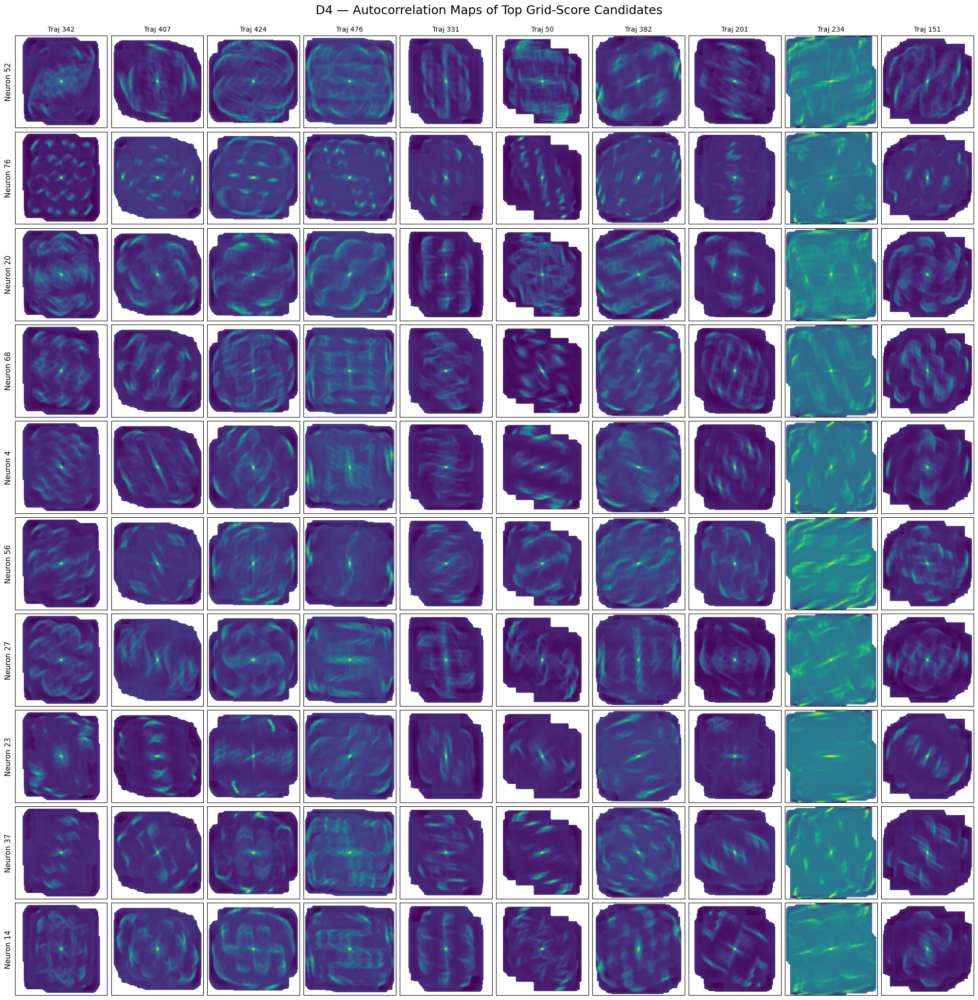

In [45]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# TOP NEURONS FROM SHUFFLE ANALYSIS
# ============================================================

top_neurons = [52, 76, 20, 68, 4, 56, 27, 23, 37, 14]

trajectory_indices = [
    342, 407, 424, 476, 331,
    50, 382, 201, 234, 151
]

# autocorr_maps shape:
# (100 neurons, 10 trajectories, 159, 159)

print("Autocorrelation maps:", autocorr_maps.shape)


# ============================================================
# NORMALIZE EACH AUTOCORRELATION MAP TO 0–1
# ============================================================

def normalize_autocorr(ac):

    ac = np.asarray(ac, dtype=np.float32)

    if not np.any(np.isfinite(ac)):
        return np.full_like(ac, np.nan)

    amin = np.nanmin(ac)
    amax = np.nanmax(ac)

    if amax - amin < 1e-12:
        return np.zeros_like(ac)

    return (ac - amin) / (amax - amin)


# ============================================================
# CREATE FIGURE
# ============================================================

n_neurons = len(top_neurons)
n_traj = len(trajectory_indices)

fig, axes = plt.subplots(
    n_neurons,
    n_traj,
    figsize=(20, 20),
    constrained_layout=True
)

# Make sure axes is 2D
if n_neurons == 1:
    axes = axes[np.newaxis, :]

if n_traj == 1:
    axes = axes[:, np.newaxis]


# ============================================================
# PLOT
# ============================================================

for row, neuron in enumerate(top_neurons):

    for col in range(n_traj):

        ax = axes[row, col]

        ac = autocorr_maps[neuron, col]

        # Normalize 0–1
        ac_norm = normalize_autocorr(ac)

        ax.imshow(
            ac_norm,
            origin="lower",
            cmap="viridis",
            vmin=0,
            vmax=1
        )

        ax.set_xticks([])
        ax.set_yticks([])

        # trajectory label
        if row == 0:
            ax.set_title(
                f"Traj {trajectory_indices[col]}",
                fontsize=10
            )

    # Row label
    axes[row, 0].set_ylabel(
        f"Neuron {neuron}",
        fontsize=11,
        rotation=90
    )


# ============================================================
# TITLE
# ============================================================

fig.suptitle(
    "D4 — Autocorrelation Maps of Top Grid-Score Candidates",
    fontsize=18,
    y=1.02
)

plt.show()